In [1]:
from nltk.corpus import brown
brown_tagged_sents = brown.tagged_sents(categories='news')
brown_sents = brown.sents(categories='news')


In [4]:
tags = [tag for (word,tag) in brown.tagged_words(categories='news')]
nltk.FreqDist(tags).max()

'NN'

In [5]:
import nltk
nltk.download('book')
from nltk.book import *

[nltk_data] Downloading collection 'book'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to C:\nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package brown to C:\nltk_data...
[nltk_data]    |   Package brown is already up-to-date!
[nltk_data]    | Downloading package chat80 to C:\nltk_data...
[nltk_data]    |   Package chat80 is already up-to-date!
[nltk_data]    | Downloading package cmudict to C:\nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package conll2000 to C:\nltk_data...
[nltk_data]    |   Package conll2000 is already up-to-date!
[nltk_data]    | Downloading package conll2002 to C:\nltk_data...
[nltk_data]    |   Package conll2002 is already up-to-date!
[nltk_data]    | Downloading package dependency_treebank to
[nltk_data]    |     C:\nltk_data...
[nltk_data]    |   Package dependency_treebank is already up-to-date!
[nltk_data]    | Downloading package genesis to

*** Introductory Examples for the NLTK Book ***
Loading text1, ..., text9 and sent1, ..., sent9
Type the name of the text or sentence to view it.
Type: 'texts()' or 'sents()' to list the materials.
text1: Moby Dick by Herman Melville 1851
text2: Sense and Sensibility by Jane Austen 1811
text3: The Book of Genesis
text4: Inaugural Address Corpus
text5: Chat Corpus
text6: Monty Python and the Holy Grail
text7: Wall Street Journal
text8: Personals Corpus
text9: The Man Who Was Thursday by G . K . Chesterton 1908


In [6]:
raw = 'I do not like green eggs and ham, I do not like them Sam I am!'
tokens = nltk.word_tokenize(raw)
default_tagger = nltk.DefaultTagger('NN')
default_tagger.tag(tokens)

[('I', 'NN'),
 ('do', 'NN'),
 ('not', 'NN'),
 ('like', 'NN'),
 ('green', 'NN'),
 ('eggs', 'NN'),
 ('and', 'NN'),
 ('ham', 'NN'),
 (',', 'NN'),
 ('I', 'NN'),
 ('do', 'NN'),
 ('not', 'NN'),
 ('like', 'NN'),
 ('them', 'NN'),
 ('Sam', 'NN'),
 ('I', 'NN'),
 ('am', 'NN'),
 ('!', 'NN')]

In [7]:
default_tagger.evaluate(brown_tagged_sents)

C:\Users\Anes\AppData\Local\Temp\ipykernel_18852\735304995.py:1: DeprecationWarning: 
  Function evaluate() has been deprecated.  Use accuracy(gold)
  instead.
  default_tagger.evaluate(brown_tagged_sents)


0.13089484257215028

In [8]:
patterns = [
(r'.*ing$', 'VBG'), # gerunds
(r'.*ed$', 'VBD'), # simple past
(r'.*es$', 'VBZ'), # 3rd singular present
(r'.*ould$', 'MD'), # modals
(r'.*\'s$', 'NN$'), # possessive nouns
(r'.*s$', 'NNS'), # plural nouns
(r'^-?[0-9]+(.[0-9]+)?$', 'CD'), # cardinal numbers
(r'.*', 'NN') # nouns (default)
]

In [9]:
regexp_tagger = nltk.RegexpTagger(patterns)
print(regexp_tagger.tag(brown_sents[3]), sep=', ')

[('``', 'NN'), ('Only', 'NN'), ('a', 'NN'), ('relative', 'NN'), ('handful', 'NN'), ('of', 'NN'), ('such', 'NN'), ('reports', 'NNS'), ('was', 'NNS'), ('received', 'VBD'), ("''", 'NN'), (',', 'NN'), ('the', 'NN'), ('jury', 'NN'), ('said', 'NN'), (',', 'NN'), ('``', 'NN'), ('considering', 'VBG'), ('the', 'NN'), ('widespread', 'NN'), ('interest', 'NN'), ('in', 'NN'), ('the', 'NN'), ('election', 'NN'), (',', 'NN'), ('the', 'NN'), ('number', 'NN'), ('of', 'NN'), ('voters', 'NNS'), ('and', 'NN'), ('the', 'NN'), ('size', 'NN'), ('of', 'NN'), ('this', 'NNS'), ('city', 'NN'), ("''", 'NN'), ('.', 'NN')]


In [10]:
regexp_tagger.evaluate(brown_tagged_sents)

C:\Users\Anes\AppData\Local\Temp\ipykernel_18852\108676848.py:1: DeprecationWarning: 
  Function evaluate() has been deprecated.  Use accuracy(gold)
  instead.
  regexp_tagger.evaluate(brown_tagged_sents)


0.20326391789486245

In [11]:
fd = nltk.FreqDist(brown.words(categories='news'))
cfd = nltk.ConditionalFreqDist(brown.tagged_words(categories='news'))
most_freq_words = list(fd.keys())[:100]
likely_tags = dict((word, cfd[word].max()) for word in most_freq_words)
baseline_tagger = nltk.UnigramTagger(model=likely_tags)
baseline_tagger.evaluate(brown_tagged_sents)


C:\Users\Anes\AppData\Local\Temp\ipykernel_18852\1057236049.py:6: DeprecationWarning: 
  Function evaluate() has been deprecated.  Use accuracy(gold)
  instead.
  baseline_tagger.evaluate(brown_tagged_sents)


0.3329355371243312

In [12]:
sent = brown.sents(categories='news')[3]
print(baseline_tagger.tag(sent), sep=', ')

[('``', '``'), ('Only', 'RB'), ('a', 'AT'), ('relative', 'JJ'), ('handful', 'NN'), ('of', 'IN'), ('such', 'JJ'), ('reports', 'NNS'), ('was', 'BEDZ'), ('received', 'VBD'), ("''", "''"), (',', ','), ('the', 'AT'), ('jury', 'NN'), ('said', 'VBD'), (',', ','), ('``', '``'), ('considering', 'IN'), ('the', 'AT'), ('widespread', 'JJ'), ('interest', 'NN'), ('in', 'IN'), ('the', 'AT'), ('election', 'NN'), (',', ','), ('the', 'AT'), ('number', 'NN'), ('of', 'IN'), ('voters', 'NNS'), ('and', 'CC'), ('the', 'AT'), ('size', 'NN'), ('of', 'IN'), ('this', 'DT'), ('city', 'NN'), ("''", "''"), ('.', '.')]


In [13]:
baseline_tagger = nltk.UnigramTagger(model=likely_tags, backoff=nltk.DefaultTagger('NN'))

C:\Users\Anes\AppData\Local\Temp\ipykernel_18852\976650498.py:4: DeprecationWarning: 
  Function evaluate() has been deprecated.  Use accuracy(gold)
  instead.
  return baseline_tagger.evaluate(brown.tagged_sents(categories='news'))


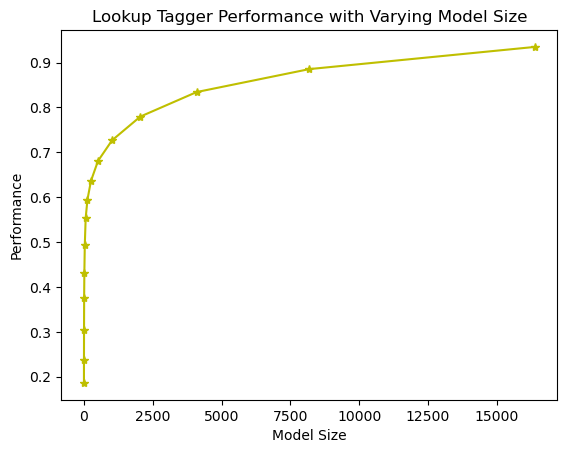

In [14]:
def performance(cfd, wordlist):
    lt = dict((word, cfd[word].max()) for word in wordlist)
    baseline_tagger = nltk.UnigramTagger(model=lt, backoff=nltk.DefaultTagger('NN'))
    return baseline_tagger.evaluate(brown.tagged_sents(categories='news'))

def display():
    import pylab
    words_by_freq = list(nltk.FreqDist(brown.words(categories='news')))
    cfd = nltk.ConditionalFreqDist(brown.tagged_words(categories='news'))
    sizes = 2 ** pylab.arange(15)
    perfs = [performance(cfd, words_by_freq[:size]) for size in sizes]
    pylab.plot(sizes, perfs, '-y*')
    pylab.title('Lookup Tagger Performance with Varying Model Size')
    pylab.xlabel('Model Size')
    pylab.ylabel('Performance')
    pylab.show()

display()

In [18]:
from nltk.corpus import brown
brown_tagged_sents = brown.tagged_sents(categories='news')
brown_sents = brown.sents(categories='news')
unigram_tagger = nltk.UnigramTagger(brown_tagged_sents)
print(unigram_tagger.tag(brown_sents[2007]), sep=', ')

unigram_tagger.evaluate(brown_tagged_sents)

[('Various', 'JJ'), ('of', 'IN'), ('the', 'AT'), ('apartments', 'NNS'), ('are', 'BER'), ('of', 'IN'), ('the', 'AT'), ('terrace', 'NN'), ('type', 'NN'), (',', ','), ('being', 'BEG'), ('on', 'IN'), ('the', 'AT'), ('ground', 'NN'), ('floor', 'NN'), ('so', 'QL'), ('that', 'CS'), ('entrance', 'NN'), ('is', 'BEZ'), ('direct', 'JJ'), ('.', '.')]


C:\Users\Anes\AppData\Local\Temp\ipykernel_18852\851006094.py:7: DeprecationWarning: 
  Function evaluate() has been deprecated.  Use accuracy(gold)
  instead.
  unigram_tagger.evaluate(brown_tagged_sents)


0.9349006503968017

In [16]:
size = int(len(brown_tagged_sents) * 0.9)
size

4160

In [19]:
train_sents = brown_tagged_sents[:size]
test_sents = brown_tagged_sents[size:]
unigram_tagger = nltk.UnigramTagger(train_sents)
unigram_tagger.evaluate(test_sents)

C:\Users\Anes\AppData\Local\Temp\ipykernel_18852\1988371040.py:4: DeprecationWarning: 
  Function evaluate() has been deprecated.  Use accuracy(gold)
  instead.
  unigram_tagger.evaluate(test_sents)


0.8121200039868434

In [20]:
bigram_tagger = nltk.BigramTagger(train_sents)
print(bigram_tagger.tag(brown_sents[2007]), sep=", ")

[('Various', 'JJ'), ('of', 'IN'), ('the', 'AT'), ('apartments', 'NNS'), ('are', 'BER'), ('of', 'IN'), ('the', 'AT'), ('terrace', 'NN'), ('type', 'NN'), (',', ','), ('being', 'BEG'), ('on', 'IN'), ('the', 'AT'), ('ground', 'NN'), ('floor', 'NN'), ('so', 'CS'), ('that', 'CS'), ('entrance', 'NN'), ('is', 'BEZ'), ('direct', 'JJ'), ('.', '.')]


In [21]:
unseen_sent = brown_sents[4203]
print(bigram_tagger.tag(unseen_sent), sep=", ")

[('The', 'AT'), ('population', 'NN'), ('of', 'IN'), ('the', 'AT'), ('Congo', 'NP'), ('is', 'BEZ'), ('13.5', None), ('million', None), (',', None), ('divided', None), ('into', None), ('at', None), ('least', None), ('seven', None), ('major', None), ('``', None), ('culture', None), ('clusters', None), ("''", None), ('and', None), ('innumerable', None), ('tribes', None), ('speaking', None), ('400', None), ('separate', None), ('dialects', None), ('.', None)]


In [22]:
bigram_tagger.evaluate(test_sents)


C:\Users\Anes\AppData\Local\Temp\ipykernel_18852\63762215.py:1: DeprecationWarning: 
  Function evaluate() has been deprecated.  Use accuracy(gold)
  instead.
  bigram_tagger.evaluate(test_sents)


0.10206319146815508

In [23]:
t0 = nltk.DefaultTagger('NN')
t1 = nltk.UnigramTagger(train_sents, backoff=t0)
t2 = nltk.BigramTagger(train_sents, backoff=t1)
t2.evaluate(test_sents)

C:\Users\Anes\AppData\Local\Temp\ipykernel_18852\2463049084.py:4: DeprecationWarning: 
  Function evaluate() has been deprecated.  Use accuracy(gold)
  instead.
  t2.evaluate(test_sents)


0.8452108043456593

In [24]:
from pickle import dump
output = open('t2.pkl', 'wb')
dump(t2, output, -1)
output.close()

In [25]:
from pickle import load
input = open('t2.pkl', 'rb')
tagger = load(input)
input.close()

In [26]:
text = """The board's action shows what free enterprise
is up against in our complex maze of regulatory laws ."""
tokens = text.split()
tagger.tag(tokens)

[('The', 'AT'),
 ("board's", 'NN$'),
 ('action', 'NN'),
 ('shows', 'NNS'),
 ('what', 'WDT'),
 ('free', 'JJ'),
 ('enterprise', 'NN'),
 ('is', 'BEZ'),
 ('up', 'RP'),
 ('against', 'IN'),
 ('in', 'IN'),
 ('our', 'PP$'),
 ('complex', 'JJ'),
 ('maze', 'NN'),
 ('of', 'IN'),
 ('regulatory', 'NN'),
 ('laws', 'NNS'),
 ('.', '.')]

In [27]:
cfd = nltk.ConditionalFreqDist(
((x[1], y[1], z[0]), z[1])
for sent in brown_tagged_sents
for x, y, z in nltk.trigrams(sent))
ambiguous_contexts = [c for c in cfd.conditions() if len(cfd[c]) > 1]
sum(cfd[c].N() for c in ambiguous_contexts) / cfd.N()

0.049297702068029296

In [28]:
test_tags = [tag for sent in brown.sents(categories='editorial') for (word, tag) in t2.tag(sent)]
gold_tags = [tag for (word, tag) in brown.tagged_words(categories='editorial')]
print(nltk.ConfusionMatrix(gold_tags, test_tags))

           |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

In [29]:
brown_tagged_sents = brown.tagged_sents(categories='news')
brown_sents = brown.sents(categories='news')
size = int(len(brown_tagged_sents) * 0.9)
train_sents = brown_tagged_sents[:size]
test_sents = brown_tagged_sents[size:]
t0 = nltk.DefaultTagger('NN')
t1 = nltk.UnigramTagger(train_sents, backoff=t0)
t2 = nltk.BigramTagger(train_sents, backoff=t1)
t2.evaluate(test_sents)

C:\Users\Anes\AppData\Local\Temp\ipykernel_18852\2577481485.py:9: DeprecationWarning: 
  Function evaluate() has been deprecated.  Use accuracy(gold)
  instead.
  t2.evaluate(test_sents)


0.8452108043456593

In [30]:
from nltk.tbl import demo as brill_tagger
brill_tagger.demo()

Loading tagged data from treebank... 
Read testing data (200 sents/5251 wds)
Read training data (800 sents/19933 wds)
Read baseline data (800 sents/19933 wds) [reused the training set]
Trained baseline tagger
    Accuracy on test set: 0.8358
Training tbl tagger...
TBL train (fast) (seqs: 800; tokens: 19933; tpls: 24; min score: 3; min acc: None)
Finding initial useful rules...
    Found 12799 useful rules.

           B      |
   S   F   r   O  |        Score = Fixed - Broken
   c   i   o   t  |  R     Fixed = num tags changed incorrect -> correct
   o   x   k   h  |  u     Broken = num tags changed correct -> incorrect
   r   e   e   e  |  l     Other = num tags changed incorrect -> incorrect
   e   d   n   r  |  e
------------------+-------------------------------------------------------
  23  23   0   0  | POS->VBZ if Pos:PRP@[-2,-1]
  18  19   1   0  | NN->VB if Pos:-NONE-@[-2] & Pos:TO@[-1]
  14  14   0   0  | VBP->VB if Pos:MD@[-2,-1]
  12  12   0   0  | VBP->VB if Pos:TO@[-1]
  

In [31]:
text = "They wind back the clock, while we chase after the wind."
tokens = text.split()
tagger.tag(tokens)

[('They', 'PPSS'),
 ('wind', 'VB'),
 ('back', 'RB'),
 ('the', 'AT'),
 ('clock,', 'NN'),
 ('while', 'CS'),
 ('we', 'PPSS'),
 ('chase', 'NN'),
 ('after', 'CS'),
 ('the', 'AT'),
 ('wind.', 'NN')]

3. Tokenize and tag the following sentence: They wind back the clock, while we chase after the wind. ** What different pronunciations and parts of speech are involved?**

In [32]:
sent = 'They wind back the clock, while we chase after the wind.'
nltk.pos_tag(nltk.word_tokenize(sent))

[('They', 'PRP'),
 ('wind', 'VBP'),
 ('back', 'RB'),
 ('the', 'DT'),
 ('clock', 'NN'),
 (',', ','),
 ('while', 'IN'),
 ('we', 'PRP'),
 ('chase', 'VBP'),
 ('after', 'IN'),
 ('the', 'DT'),
 ('wind', 'NN'),
 ('.', '.')]

10. Train a unigram tagger and run it on some new text. Observe that some words are not assigned a tag. Why not?

In [33]:
brown_tagged_sents = brown.tagged_sents(categories='news')
unigram_tagger = nltk.UnigramTagger(brown_tagged_sents)

test_text = ['hello', 'world', 'natural', 'language', 'processing', 'semso']
unigram_tagger.tag(test_text)
# The words doesn't appear in the training text, and therefore 
#the tagger can't speculate the word's tag.



[('hello', None),
 ('world', 'NN'),
 ('natural', 'JJ'),
 ('language', 'NN'),
 ('processing', 'NN'),
 ('semso', None)]

14. Use sorted() ** and ** set() ** to get a sorted list of tags used in the Brown corpus, removing duplicates.**



In [34]:
list_of_tags = sorted(set([tag for (_, tag) in brown.tagged_words()]))

In [35]:
list_of_tags
# _ - underscore, it is used to intentionally ignore the value

["'",
 "''",
 '(',
 '(-HL',
 ')',
 ')-HL',
 '*',
 '*-HL',
 '*-NC',
 '*-TL',
 ',',
 ',-HL',
 ',-NC',
 ',-TL',
 '--',
 '---HL',
 '.',
 '.-HL',
 '.-NC',
 '.-TL',
 ':',
 ':-HL',
 ':-TL',
 'ABL',
 'ABN',
 'ABN-HL',
 'ABN-NC',
 'ABN-TL',
 'ABX',
 'AP',
 'AP$',
 'AP+AP-NC',
 'AP-HL',
 'AP-NC',
 'AP-TL',
 'AT',
 'AT-HL',
 'AT-NC',
 'AT-TL',
 'AT-TL-HL',
 'BE',
 'BE-HL',
 'BE-TL',
 'BED',
 'BED*',
 'BED-NC',
 'BEDZ',
 'BEDZ*',
 'BEDZ-HL',
 'BEDZ-NC',
 'BEG',
 'BEM',
 'BEM*',
 'BEM-NC',
 'BEN',
 'BEN-TL',
 'BER',
 'BER*',
 'BER*-NC',
 'BER-HL',
 'BER-NC',
 'BER-TL',
 'BEZ',
 'BEZ*',
 'BEZ-HL',
 'BEZ-NC',
 'BEZ-TL',
 'CC',
 'CC-HL',
 'CC-NC',
 'CC-TL',
 'CC-TL-HL',
 'CD',
 'CD$',
 'CD-HL',
 'CD-NC',
 'CD-TL',
 'CD-TL-HL',
 'CS',
 'CS-HL',
 'CS-NC',
 'CS-TL',
 'DO',
 'DO*',
 'DO*-HL',
 'DO+PPSS',
 'DO-HL',
 'DO-NC',
 'DO-TL',
 'DOD',
 'DOD*',
 'DOD*-TL',
 'DOD-NC',
 'DOZ',
 'DOZ*',
 'DOZ*-TL',
 'DOZ-HL',
 'DOZ-TL',
 'DT',
 'DT$',
 'DT+BEZ',
 'DT+BEZ-NC',
 'DT+MD',
 'DT-HL',
 'DT-NC',
 'DT-TL',
 'D


    Generate some statistics for tagged data to answer the following questions: a. What proportion of word types are always assigned the same part-of-speech tag? b. How many words are ambiguous, in the sense that they appear with at least two tags? c. What percentage of word tokens ** in the Brown Corpus involve these ambiguous words?**



In [36]:
brown_tag = brown.tagged_words(tagset = 'universal')
cfd = nltk.ConditionalFreqDist(brown_tag)

In [37]:
cfd

<ConditionalFreqDist with 56057 conditions>

In [38]:
proportion = sum(1 for word in cfd if len(cfd[word]) == 1) / len(cfd)

In [39]:
ambiguous = sum(1 for word in cfd if len(cfd[word]) > 1)

In [40]:
proportion

0.9358510087946198

In [41]:
ambiguous

3596

Write code to search the Brown Corpus for particular words and phrases according to tags, to answer the following questions: a. Produce an alphabetically sorted list of the distinct words tagged as MD. b. Identify words that can be plural nouns or third person singular verbs (e.g., deals, flies). c. Identify three-word prepositional phrases of the form IN + DET + NN (e.g., in the lab). d. masculine proportion

In [42]:
from nltk.corpus import brown
import nltk

text = brown.words()
tagged_text = brown.tagged_words()
set_text = set(text)
cfd = nltk.ConditionalFreqDist(tagged_text)
conditions = cfd.conditions()

# # produces the alphabetically sorted list of distinct words tagged as MD.

md_words = [condition for condition in conditions if cfd[condition]['MD'] != 0]
md_words.sort()

print(md_words)

# # question two - 2. Identify words that can be plural nouns or third person singular verbs (e.g. deals, flies).

two_words = [condition for condition in conditions if cfd[condition]['NNS'] and cfd[condition]['VBZ']]
two_words.sort()
print(two_words)

# # question four

fd = nltk.FreqDist(text)
masc_fem_proportion = (fd['he'] + fd['He']) / (fd['she'] + fd['She'])
print(masc_fem_proportion)

# 3. Identify three-word prepositional phrases of the form IN + DET + NN (eg. in the lab).


#zip(*trigram): The zip function takes multiple iterables and returns an iterator that generates tuples containing elements 
#from the input iterables, paired together. In this case, the *trigram is a way of unpacking the contents of the trigram 
#iterable. 
#It assumes that trigram is a sequence of iterables, and the * operator unpacks them as separate arguments to zip.

# pulls out trigrams for the tagged text
tagged_text = brown.tagged_words()
trigrams = list(nltk.trigrams(tagged_text))
for trigram in trigrams:
	zipped_tag = [t for t in zip(*trigram)]
	if zipped_tag[1] == ('IN', 'DT', 'NN'):
		print(zipped_tag[0])

# note - this is the idea. but there must not be three word phrases of the sort that they are talking about. It works for other combinations but not for those three.

['Can', 'Could', 'May', 'Might', 'Must', 'Ought', 'Shall', 'Should', 'Will', 'Would', "c'n", 'can', 'colde', 'could', 'dare', 'kin', 'maht', 'mai', 'may', 'maye', 'mayst', 'might', 'must', 'need', 'ought', 'shall', 'should', 'shuld', 'shulde', 'wil', 'will', 'wilt', 'wod', 'wold', 'wolde', 'would']
['Aids', 'Designs', 'Increases', 'Makes', 'Reports', 'Says', 'accounts', 'acts', 'addresses', 'advances', 'affects', 'aids', 'aims', 'amounts', 'answers', 'appeals', 'approaches', 'arches', 'assaults', 'associates', 'attacks', 'attempts', 'attributes', 'backs', 'bangs', 'banks', 'bargains', 'bars', 'bases', 'bats', 'beats', 'bellows', 'belts', 'bends', 'benefits', 'bites', 'blankets', 'blots', 'blows', 'blueprints', 'boards', 'bodies', 'borders', 'bores', 'bottles', 'bows', 'breaks', 'bridges', 'bristles', 'bubbles', 'bugs', 'bulletins', 'bullies', 'burns', 'butts', 'calls', 'caps', 'captures', 'cares', 'casts', 'catches', 'causes', 'censors', 'centers', 'challenges', 'champions', 'changes',

('of', 'each', 'day')
('for', 'that', 'purpose')
('on', 'this', 'point')
('in', 'this', 'situation')
('of', 'this', 'approach')
('at', 'each', 'stage')
('In', 'this', 'process')
('at', 'this', 'time')
('on', 'this', 'point')
('of', 'that', 'period')
('of', 'that', 'year')
('into', 'this', 'country')
('of', 'that', 'statement')
('with', 'another', 'beauty')
('By', 'this', 'time')
('during', 'that', 'time')
('with', 'each', 'squeeze')
('For', 'that', 'reason')
('in', 'this', 'vein')
('After', 'another', 'treatment')
('In', 'this', 'sense')
('on', 'this', 'side')
('in', 'this', 'experiment')
('of', 'this', 'sort')
('in', 'this', 'drama')
('In', 'this', 'case')
('on', 'this', 'question')
('of', 'this', 'type')
('In', 'another', 'approach')
('In', 'this', 'connection')
('in', 'another', 'locality')
('to', 'that', 'crop')
('of', 'this', 'testimony')
('by', 'this', 'awfulness')
('of', 'this', 'sort')
('to', 'this', 'question')
('on', 'this', 'score')
('to', 'that', 'extent')
('in', 'this', 'c

('at', 'this', 'stage')
('in', 'this', 'respect')
('from', 'this', 'approach')
('on', 'this', 'report')
('in', 'this', 'lung')
('in', 'this', 'group')
('In', 'this', 'instance')
('in', 'this', 'statement')
('in', 'this', 'matter')
('to', 'this', 'point')
('of', 'this', 'variation')
('of', 'this', 'viewpoint')
('in', 'that', 'species')
('for', 'each', 'sex')
('in', 'this', 'value')
('of', 'this', 'study')
('of', 'each', 'arrow')
('of', 'each', 'child')
('in', 'this', 'paper')
('of', 'each', 'figure')
('for', 'each', 'center')
('of', 'each', 'child')
('for', 'each', 'growth')
('for', 'each', 'growth')
('in', 'this', 'monograph')
('in', 'this', 'center')
('for', 'each', 'growth')
('for', 'this', 'particular')
('in', 'this', 'phalanx')
('in', 'this', 'group')
('of', 'this', 'coupling')
('during', 'this', 'period')
('of', 'this', 'work')
('since', 'that', 'time')
('in', 'this', 'paper')
('at', 'that', 'time')
('at', 'this', 'time')
('at', 'this', 'time')
('At', 'this', 'time')
('at', 'this'

('off', 'this', 'job')
('to', 'this', 'world')
('at', 'this', 'line')
('in', 'another', 'day')
('into', 'that', 'inferno')
('of', 'this', 'archipelago')
('with', 'that', 'process')
('on', 'this', 'island')
('of', 'this', 'island')
('With', 'this', 'realization')
('at', 'each', 'end')
('in', 'this', 'bunch')
('in', 'that', 'jungle')
('at', 'this', 'point')
('in', 'this', 'case')
('down', 'this', 'line')
('on', 'this', 'trip')
('for', 'this', 'country')
('for', 'this', 'dive')
('at', 'this', 'time')
('at', 'this', 'time')
('of', 'that', 'mess')
('from', 'this', 'time')
('of', 'this', 'town')
('by', 'that', 'time')
('from', 'this', 'barn')
('into', 'that', 'barn')
('Along', 'each', 'side')
('in', 'this', 'snow')
('in', 'this', 'chamois')
('with', 'this', 'vow')
('in', 'this', 'car')
('without', 'that', 'dog')
('down', 'that', 'street')
('into', 'that', 'streetcar')
('before', 'each', 'step')
('for', 'this', 'summer')
('at', 'this', 'moment')
('of', 'that', 'ability')
('upon', 'this', 'mis

6. There are 264 distinct words in the Brown Corpus having exactly three possible tags. 
a. Print a table with the integers 1..10 in one column, and the number of distinct words in the corpus having 1..10 distinct tags in the other column. 
b. For the word with the greatest number of distinct tags, print out sentences from the corpus containing the word, one for each possible tag

In [44]:
from tabulate import tabulate
tags = brown.tagged_words()
cfd = nltk.ConditionalFreqDist(tags)

num_tags = []
for condition in cfd.conditions():
    num_tags.append((condition, len(cfd[condition])))

tags_by_num = []

for i in range(11):
    this_num = 0
    for (word, num) in num_tags:
        if num == i:
            this_num += 1
    tags_by_num.append((i, this_num))

# prints a table of the integers 1-10 and the numbers of distinct words in the corpus that have those numbers of distinct tags

print(tabulate(tags_by_num))

# "that" is the word with the most distinct tags.
distinct_tags = [tag for tag in cfd['that']]

tagged_sents = brown.tagged_sents()

# go through each sentence in the corpus. 
# go through each tag in the sentence

for sent in tagged_sents:
    for (word, tag) in sent:
        for distinct_tag in distinct_tags:
            if distinct_tag == tag and (word == 'That' or word == 'that'):
                print(sent)
                distinct_tags.remove(distinct_tag)
                print("************")
                break

--  -----
 0      0
 1  47328
 2   7186
 3   1146
 4    265
 5     87
 6     27
 7     12
 8      1
 9      1
10      2
--  -----
[('The', 'AT'), ('Fulton', 'NP-TL'), ('County', 'NN-TL'), ('Grand', 'JJ-TL'), ('Jury', 'NN-TL'), ('said', 'VBD'), ('Friday', 'NR'), ('an', 'AT'), ('investigation', 'NN'), ('of', 'IN'), ("Atlanta's", 'NP$'), ('recent', 'JJ'), ('primary', 'NN'), ('election', 'NN'), ('produced', 'VBD'), ('``', '``'), ('no', 'AT'), ('evidence', 'NN'), ("''", "''"), ('that', 'CS'), ('any', 'DTI'), ('irregularities', 'NNS'), ('took', 'VBD'), ('place', 'NN'), ('.', '.')]
************
[('Regarding', 'IN'), ("Atlanta's", 'NP$'), ('new', 'JJ'), ('multi-million-dollar', 'JJ'), ('airport', 'NN'), (',', ','), ('the', 'AT'), ('jury', 'NN'), ('recommended', 'VBD'), ('``', '``'), ('that', 'CS'), ('when', 'WRB'), ('the', 'AT'), ('new', 'JJ'), ('management', 'NN'), ('takes', 'VBZ'), ('charge', 'NN'), ('Jan.', 'NP'), ('1', 'CD'), ('the', 'AT'), ('airport', 'NN'), ('be', 'BE'), ('operated', 'VB

In [45]:
# ★ Create a regular expression tagger and various unigram and n-gram taggers, incorporating backoff, and train them on part of the Brown corpus.
# Create three different combinations of the taggers. Test the accuracy of each combined tagger. Which combination works best?

# the best combination is the kind that moves from most specific to most general. So the default tagger and the regex tagger are the last backoff.

# Try varying the size of the training corpus. How does it affect your results?

import nltk
from nltk.corpus import brown

# getting the data ready

tagged_sents = brown.tagged_sents(categories='news')

size = int(len(tagged_sents) * 0.99)
train_sents = tagged_sents[:size]
test_sents = tagged_sents[size:]


patterns = [
     (r'.*ing$', 'VBG'),               # gerunds
     (r'.*ed$', 'VBD'),                # simple past
     (r'.*es$', 'VBZ'),                # 3rd singular present
     (r'.*ould$', 'MD'),               # modals
     (r'.*\'s$', 'NN$'),               # possessive nouns
     (r'.*s$', 'NNS'),                 # plural nouns
     (r'^-?[0-9]+(.[0-9]+)?$', 'CD'),  # cardinal numbers
     (r'.*', 'NN')                     # nouns (default)
     ]


t0 = nltk.DefaultTagger('NN')
tr = nltk.RegexpTagger(patterns, backoff=t0)
t1 = nltk.UnigramTagger(train_sents, backoff=tr)
t2 = nltk.BigramTagger(train_sents, backoff=t1)
print(t2.evaluate(test_sents))

0.8946428571428572


C:\Users\Anes\AppData\Local\Temp\ipykernel_18852\1247405412.py:36: DeprecationWarning: 
  Function evaluate() has been deprecated.  Use accuracy(gold)
  instead.
  print(t2.evaluate(test_sents))


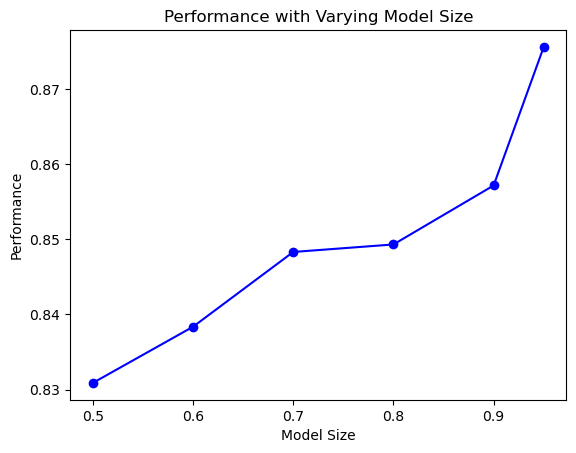

In [46]:
def performance(prec):

    size = int(len(tagged_sents) * prec)
    train_sents = tagged_sents[:size]
    test_sents = tagged_sents[size:]

    t0 = nltk.DefaultTagger('NN')
    tr = nltk.BigramTagger(train_sents, backoff=t0)
    t1 = nltk.RegexpTagger(patterns, backoff=tr)
    t2 = nltk.UnigramTagger(train_sents, backoff=t1)
    return t2.accuracy(test_sents)

def display():
    import pylab
    sizes = [0.5,0.6,0.7,0.8,0.9,0.95]
    perfs = [performance(size) for size in sizes]
    pylab.plot(sizes, perfs, '-bo')
    pylab.title('Performance with Varying Model Size')
    pylab.xlabel('Model Size')
    pylab.ylabel('Performance')
    pylab.show()

display()


In [47]:
def gender_features(word):
    return {'last_letter': word[-1]}
gender_features('Shrek')

{'last_letter': 'k'}

In [48]:
import nltk
from nltk.corpus import names
nltk.download('names')
import random
names = ([(name, 'male') for name in names.words('male.txt')] + [(name, 'female') for name in names.words('female.txt')])
random.shuffle(names)

[nltk_data] Downloading package names to C:\nltk_data...
[nltk_data]   Package names is already up-to-date!


In [49]:
names


[('Guido', 'male'),
 ('Reta', 'female'),
 ('Melvyn', 'male'),
 ('Lion', 'male'),
 ('Claudio', 'male'),
 ('Worthington', 'male'),
 ('Maddie', 'female'),
 ('Blakelee', 'female'),
 ('Nathanael', 'male'),
 ('Ilsa', 'female'),
 ('Helen', 'female'),
 ('Lamont', 'male'),
 ('Stefan', 'male'),
 ('Harley', 'male'),
 ('Carlyn', 'female'),
 ('Franky', 'female'),
 ('Jean-Luc', 'male'),
 ('Carrissa', 'female'),
 ('Nananne', 'female'),
 ('Tally', 'female'),
 ('Penrod', 'male'),
 ('Aliza', 'female'),
 ('Porter', 'male'),
 ('Darice', 'female'),
 ('Ashely', 'female'),
 ('Garold', 'male'),
 ('Teodoro', 'male'),
 ('Cindie', 'female'),
 ('Tabbie', 'male'),
 ('Jeffery', 'male'),
 ('Basil', 'male'),
 ('Grata', 'female'),
 ('Brandea', 'female'),
 ('Moya', 'female'),
 ('Tremayne', 'male'),
 ('Leora', 'female'),
 ('Umberto', 'male'),
 ('Marquita', 'female'),
 ('Averell', 'male'),
 ('Derick', 'male'),
 ('Clement', 'male'),
 ('Toby', 'female'),
 ('Phylis', 'female'),
 ('Freddie', 'male'),
 ('Velvet', 'female'),
 

In [50]:
featuresets = [(gender_features(n), g) for (n,g) in names]
train_set, test_set = featuresets[500:], featuresets[:500]
classifier = nltk.NaiveBayesClassifier.train(train_set)

In [51]:
classifier.classify(gender_features('Neo'))

'male'

In [52]:
classifier.classify(gender_features('Trinity'))

'female'

In [53]:
nltk.classify.accuracy(classifier, test_set)

0.762

In [54]:
classifier.show_most_informative_features(5)

Most Informative Features
             last_letter = 'k'              male : female =     42.4 : 1.0
             last_letter = 'a'            female : male   =     33.3 : 1.0
             last_letter = 'v'              male : female =     17.5 : 1.0
             last_letter = 'f'              male : female =     15.9 : 1.0
             last_letter = 'p'              male : female =     12.5 : 1.0


In [55]:
from nltk.classify import apply_features
train_set = apply_features(gender_features, names[500:])
test_set = apply_features(gender_features, names[:500])

In [56]:
train_set

[({'last_letter': 'e'}, 'female'), ({'last_letter': 'b'}, 'female'), ...]

In [57]:
test_set

[({'last_letter': 'o'}, 'male'), ({'last_letter': 'a'}, 'female'), ...]

In [58]:
def gender_features2(name):
    features = {}
    features["firstletter"] = name[0].lower()
    features["lastletter"] = name[-1].lower()
    for letter in 'abcdefghijklmnopqrstuvwxyz':
        features["count(%s)" % letter] = name.lower().count(letter)
        features["has(%s)" % letter] = (letter in name.lower())
    return features

In [59]:
gender_features2('Johnn')

{'firstletter': 'j',
 'lastletter': 'n',
 'count(a)': 0,
 'has(a)': False,
 'count(b)': 0,
 'has(b)': False,
 'count(c)': 0,
 'has(c)': False,
 'count(d)': 0,
 'has(d)': False,
 'count(e)': 0,
 'has(e)': False,
 'count(f)': 0,
 'has(f)': False,
 'count(g)': 0,
 'has(g)': False,
 'count(h)': 1,
 'has(h)': True,
 'count(i)': 0,
 'has(i)': False,
 'count(j)': 1,
 'has(j)': True,
 'count(k)': 0,
 'has(k)': False,
 'count(l)': 0,
 'has(l)': False,
 'count(m)': 0,
 'has(m)': False,
 'count(n)': 2,
 'has(n)': True,
 'count(o)': 1,
 'has(o)': True,
 'count(p)': 0,
 'has(p)': False,
 'count(q)': 0,
 'has(q)': False,
 'count(r)': 0,
 'has(r)': False,
 'count(s)': 0,
 'has(s)': False,
 'count(t)': 0,
 'has(t)': False,
 'count(u)': 0,
 'has(u)': False,
 'count(v)': 0,
 'has(v)': False,
 'count(w)': 0,
 'has(w)': False,
 'count(x)': 0,
 'has(x)': False,
 'count(y)': 0,
 'has(y)': False,
 'count(z)': 0,
 'has(z)': False}

In [60]:
train_names = names[1500:]
devtest_names = names[500:1500]
test_names = names[:500]

In [61]:
train_names

[('Emma', 'female'),
 ('Laurella', 'female'),
 ('Agnesse', 'female'),
 ('Tore', 'male'),
 ('Hermine', 'female'),
 ('Tawsha', 'female'),
 ('Terry', 'male'),
 ('Andi', 'female'),
 ('Delly', 'female'),
 ('Camellia', 'female'),
 ('Annabell', 'female'),
 ('Dominick', 'male'),
 ('Leonardo', 'male'),
 ('Kiri', 'female'),
 ('Marnia', 'female'),
 ('Johanna', 'female'),
 ('Jefferey', 'male'),
 ('Dionis', 'female'),
 ('Worden', 'male'),
 ('Paula', 'female'),
 ('Berny', 'female'),
 ('Roderic', 'male'),
 ('Graehme', 'male'),
 ('Lowell', 'male'),
 ('Agnes', 'female'),
 ('Haily', 'female'),
 ('Fina', 'female'),
 ('Caren', 'female'),
 ('Reed', 'male'),
 ('Elwira', 'female'),
 ('Susan', 'female'),
 ('Roderich', 'male'),
 ('Maribel', 'female'),
 ('Waly', 'female'),
 ('Don', 'male'),
 ('Peggi', 'female'),
 ('Jacqui', 'female'),
 ('Ediva', 'female'),
 ('Terra', 'female'),
 ('Starlin', 'female'),
 ('Sapphire', 'female'),
 ('Elvin', 'male'),
 ('Zara', 'female'),
 ('Beau', 'female'),
 ('Kiley', 'female'),
 (

In [62]:
devtest_names

[('Vernice', 'female'),
 ('Sib', 'female'),
 ('Quintin', 'male'),
 ('Helen-Elizabeth', 'female'),
 ('Rhiamon', 'female'),
 ('Pennie', 'male'),
 ('Jermaine', 'female'),
 ('Bianca', 'female'),
 ('Thedric', 'male'),
 ('Myke', 'male'),
 ('Debera', 'female'),
 ('Nonah', 'female'),
 ('Berke', 'male'),
 ('Malanie', 'female'),
 ('Hammad', 'male'),
 ('Judson', 'male'),
 ('Anetta', 'female'),
 ('Cleo', 'female'),
 ('Tamiko', 'female'),
 ('Suzette', 'female'),
 ('Tony', 'male'),
 ('Joanne', 'female'),
 ('Demetris', 'male'),
 ('Kari', 'female'),
 ('Eloise', 'female'),
 ('Angie', 'female'),
 ('Doroteya', 'female'),
 ('Dorine', 'female'),
 ('Fannie', 'female'),
 ('Danielle', 'female'),
 ('Almeria', 'female'),
 ('Morton', 'male'),
 ('Gray', 'female'),
 ('Doug', 'male'),
 ('Brice', 'male'),
 ('Leopold', 'male'),
 ('Flory', 'female'),
 ('Mireielle', 'female'),
 ('Harley', 'female'),
 ('Henryetta', 'female'),
 ('Adair', 'male'),
 ('Tray', 'male'),
 ('Jennee', 'female'),
 ('Aloisia', 'female'),
 ('Camel'

In [63]:
test_names

[('Guido', 'male'),
 ('Reta', 'female'),
 ('Melvyn', 'male'),
 ('Lion', 'male'),
 ('Claudio', 'male'),
 ('Worthington', 'male'),
 ('Maddie', 'female'),
 ('Blakelee', 'female'),
 ('Nathanael', 'male'),
 ('Ilsa', 'female'),
 ('Helen', 'female'),
 ('Lamont', 'male'),
 ('Stefan', 'male'),
 ('Harley', 'male'),
 ('Carlyn', 'female'),
 ('Franky', 'female'),
 ('Jean-Luc', 'male'),
 ('Carrissa', 'female'),
 ('Nananne', 'female'),
 ('Tally', 'female'),
 ('Penrod', 'male'),
 ('Aliza', 'female'),
 ('Porter', 'male'),
 ('Darice', 'female'),
 ('Ashely', 'female'),
 ('Garold', 'male'),
 ('Teodoro', 'male'),
 ('Cindie', 'female'),
 ('Tabbie', 'male'),
 ('Jeffery', 'male'),
 ('Basil', 'male'),
 ('Grata', 'female'),
 ('Brandea', 'female'),
 ('Moya', 'female'),
 ('Tremayne', 'male'),
 ('Leora', 'female'),
 ('Umberto', 'male'),
 ('Marquita', 'female'),
 ('Averell', 'male'),
 ('Derick', 'male'),
 ('Clement', 'male'),
 ('Toby', 'female'),
 ('Phylis', 'female'),
 ('Freddie', 'male'),
 ('Velvet', 'female'),
 

In [64]:
train_set = [(gender_features(n), g) for (n,g) in train_names]
devtest_set = [(gender_features(n), g) for (n,g) in devtest_names]
test_set = [(gender_features(n), g) for (n,g) in test_names]
classifier = nltk.NaiveBayesClassifier.train(train_set) 
print(nltk.classify.accuracy(classifier, devtest_set))

0.753


In [65]:
errors = []
for (name, tag) in devtest_names:
    guess = classifier.classify(gender_features(name))
    if guess != tag:
        errors.append( (tag, guess, name) )


In [66]:
errors

[('female', 'male', 'Sib'),
 ('female', 'male', 'Rhiamon'),
 ('male', 'female', 'Pennie'),
 ('male', 'female', 'Myke'),
 ('male', 'female', 'Berke'),
 ('female', 'male', 'Cleo'),
 ('female', 'male', 'Tamiko'),
 ('male', 'female', 'Tony'),
 ('male', 'female', 'Brice'),
 ('male', 'female', 'Tray'),
 ('female', 'male', 'Noellyn'),
 ('female', 'male', 'Glenn'),
 ('male', 'female', 'Isadore'),
 ('male', 'female', 'Zach'),
 ('male', 'female', 'Hazel'),
 ('male', 'female', 'Murdoch'),
 ('female', 'male', 'Min'),
 ('male', 'female', 'Filipe'),
 ('male', 'female', 'Mitchael'),
 ('male', 'female', 'Ansell'),
 ('female', 'male', 'Ingaberg'),
 ('female', 'male', 'Rozalin'),
 ('male', 'female', 'Welch'),
 ('male', 'female', 'Page'),
 ('female', 'male', 'Eden'),
 ('male', 'female', 'Lex'),
 ('male', 'female', 'Rahul'),
 ('male', 'female', 'Matty'),
 ('male', 'female', 'Addie'),
 ('male', 'female', 'Demetre'),
 ('female', 'male', 'Arleen'),
 ('male', 'female', 'Gordie'),
 ('female', 'male', 'Cinnamon

In [67]:
for (tag, guess, name) in sorted(errors): # doctest: +ELLIPSIS +NORMALIZE_WHITESPACE
    print('correct=%-8s guess=%-8s name=%-30s' %
(tag, guess, name))

correct=female   guess=male     name=Alison                        
correct=female   guess=male     name=Allyn                         
correct=female   guess=male     name=Amargo                        
correct=female   guess=male     name=Amber                         
correct=female   guess=male     name=Ardelis                       
correct=female   guess=male     name=Arleen                        
correct=female   guess=male     name=Babs                          
correct=female   guess=male     name=Bliss                         
correct=female   guess=male     name=Brenn                         
correct=female   guess=male     name=Bridgett                      
correct=female   guess=male     name=Cam                           
correct=female   guess=male     name=Candis                        
correct=female   guess=male     name=Carlynn                       
correct=female   guess=male     name=Carmon                        
correct=female   guess=male     name=Carolan    

In [72]:
def gender_features(word):
    return {'suffix1': word[-1:], 'suffix2': word[-2:]}

In [73]:
train_set = [(gender_features(n), g) for (n,g) in train_names]
devtest_set = [(gender_features(n), g) for (n,g) in devtest_names]
classifier = nltk.NaiveBayesClassifier.train(train_set)
print(nltk.classify.accuracy(classifier, devtest_set))

0.781


In [74]:
train_set = [(gender_features(n), g) for (n,g) in train_names]
devtest_set = [(gender_features(n), g) for (n,g) in devtest_names]
test_set = [(gender_features(n), g) for (n,g) in test_names]
classifier = nltk.NaiveBayesClassifier.train(train_set) 
print(nltk.classify.accuracy(classifier, devtest_set))

0.781


In [75]:
import nltk
nltk.download('movie_reviews')
from nltk.corpus import movie_reviews
documents = [(list(movie_reviews.words(fileid)), category)
for category in movie_reviews.categories()
for fileid in movie_reviews.fileids(category)]
random.shuffle(documents)

[nltk_data] Downloading package movie_reviews to C:\nltk_data...
[nltk_data]   Package movie_reviews is already up-to-date!


In [76]:
all_words = nltk.FreqDist(w.lower() for w in movie_reviews.words())
word_features = list(all_words.keys())[:2000]

In [77]:
documents

[(['a',
   'sci',
   'fi',
   '/',
   'comedy',
   'starring',
   'jack',
   'nicholson',
   ',',
   'pierce',
   'brosnan',
   ',',
   'annette',
   'benning',
   ',',
   'glenn',
   'close',
   ',',
   'martin',
   'short',
   'and',
   'other',
   'stars',
   '.',
   'a',
   'warner',
   'bros',
   'picture',
   'the',
   'martians',
   'have',
   'landed',
   'in',
   'this',
   'hillarous',
   'tim',
   'burton',
   'movie',
   '.',
   'before',
   'entering',
   'the',
   'cinema',
   ',',
   'i',
   'was',
   'initially',
   'a',
   'little',
   'bit',
   'nervous',
   'about',
   'what',
   'this',
   'film',
   'would',
   'be',
   'like',
   '.',
   'many',
   'people',
   'were',
   'saying',
   'that',
   'this',
   'film',
   'was',
   'silly',
   'rubbish',
   ',',
   'and',
   'there',
   'was',
   'no',
   'point',
   'to',
   'it',
   'all',
   '.',
   'how',
   'wrong',
   'they',
   'were',
   '.',
   'i',
   'left',
   'this',
   'film',
   'feeling',
   'much',
   

In [78]:
def document_features(document):
    document_words = set(document)
    features = {}
    for word in word_features:
        features['contains(%s)' % word] = (word in document_words)
    return features

In [79]:
print(document_features(movie_reviews.words('pos/cv957_8737.txt')))

{'contains(plot)': True, 'contains(:)': True, 'contains(two)': True, 'contains(teen)': False, 'contains(couples)': False, 'contains(go)': False, 'contains(to)': True, 'contains(a)': True, 'contains(church)': False, 'contains(party)': False, 'contains(,)': True, 'contains(drink)': False, 'contains(and)': True, 'contains(then)': True, 'contains(drive)': False, 'contains(.)': True, 'contains(they)': True, 'contains(get)': True, 'contains(into)': True, 'contains(an)': True, 'contains(accident)': False, 'contains(one)': True, 'contains(of)': True, 'contains(the)': True, 'contains(guys)': False, 'contains(dies)': False, 'contains(but)': True, 'contains(his)': True, 'contains(girlfriend)': True, 'contains(continues)': False, 'contains(see)': False, 'contains(him)': True, 'contains(in)': True, 'contains(her)': False, 'contains(life)': False, 'contains(has)': True, 'contains(nightmares)': False, 'contains(what)': True, "contains(')": True, 'contains(s)': True, 'contains(deal)': False, 'contains

In [80]:
word_features

['plot',
 ':',
 'two',
 'teen',
 'couples',
 'go',
 'to',
 'a',
 'church',
 'party',
 ',',
 'drink',
 'and',
 'then',
 'drive',
 '.',
 'they',
 'get',
 'into',
 'an',
 'accident',
 'one',
 'of',
 'the',
 'guys',
 'dies',
 'but',
 'his',
 'girlfriend',
 'continues',
 'see',
 'him',
 'in',
 'her',
 'life',
 'has',
 'nightmares',
 'what',
 "'",
 's',
 'deal',
 '?',
 'watch',
 'movie',
 '"',
 'sorta',
 'find',
 'out',
 'critique',
 'mind',
 '-',
 'fuck',
 'for',
 'generation',
 'that',
 'touches',
 'on',
 'very',
 'cool',
 'idea',
 'presents',
 'it',
 'bad',
 'package',
 'which',
 'is',
 'makes',
 'this',
 'review',
 'even',
 'harder',
 'write',
 'since',
 'i',
 'generally',
 'applaud',
 'films',
 'attempt',
 'break',
 'mold',
 'mess',
 'with',
 'your',
 'head',
 'such',
 '(',
 'lost',
 'highway',
 '&',
 'memento',
 ')',
 'there',
 'are',
 'good',
 'ways',
 'making',
 'all',
 'types',
 'these',
 'folks',
 'just',
 'didn',
 't',
 'snag',
 'correctly',
 'seem',
 'have',
 'taken',
 'pretty',


In [81]:
featuresets = [(document_features(d), c) for (d,c) in documents]
train_set, test_set = featuresets[100:], featuresets[:100]
classifier = nltk.NaiveBayesClassifier.train(train_set)

In [82]:
print(nltk.classify.accuracy(classifier, test_set))

0.76


In [83]:
classifier.show_most_informative_features(5)

Most Informative Features
        contains(justin) = True              neg : pos    =      8.9 : 1.0
 contains(unimaginative) = True              neg : pos    =      8.3 : 1.0
       contains(martian) = True              neg : pos    =      7.6 : 1.0
    contains(schumacher) = True              neg : pos    =      6.9 : 1.0
        contains(shoddy) = True              neg : pos    =      6.9 : 1.0


In [84]:
import nltk
from nltk.corpus import brown
suffix_fdist = nltk.FreqDist()
for word in brown.words():
    word = word.lower()
    suffix_fdist[word[-1:]]+=1 #.inc(word[-1:])
    suffix_fdist[word[-2:]]+=1
    suffix_fdist[word[-3:]]+=1

In [85]:
common_suffixes = list(suffix_fdist.keys())[:100]

In [86]:
print(common_suffixes )

['e', 'he', 'the', 'n', 'on', 'ton', 'y', 'ty', 'nty', 'd', 'nd', 'and', 'ry', 'ury', 'id', 'aid', 'ay', 'day', 'an', 'ion', 'f', 'of', 's', "'s", "a's", 't', 'nt', 'ent', 'ary', 'ed', 'ced', '`', '``', 'o', 'no', 'ce', 'nce', "'", "''", 'at', 'hat', 'ny', 'any', 'es', 'ies', 'k', 'ok', 'ook', 'ace', '.', 'r', 'er', 'her', 'in', 'end', 'ts', 'nts', 'ity', 've', 'ive', 'ee', 'tee', ',', 'h', 'ch', 'ich', 'ad', 'had', 'l', 'll', 'all', 'ge', 'rge', 'ves', 'se', 'ise', 'ks', 'nks', 'a', 'ta', 'nta', 'or', 'for', 'ner', 'as', 'was', 'ted', 'ber', 'm', 'rm', 'erm', 'en', 'een', 'ged', 'by', 'ior', 'rt', 'urt', 'dge', 'od']


In [87]:
def pos_features(word):
    features = {}
    for suffix in common_suffixes:
        features['endswith(%s)' % suffix] = word.lower().endswith(suffix)
    return features

In [89]:
tagged_words = brown.tagged_words(categories='news')
featuresets = [(pos_features(n), g) for (n,g) in tagged_words]

size = int(len(featuresets) * 0.1)
train_set, test_set = featuresets[size:], featuresets[:size]

classifier = nltk.DecisionTreeClassifier.train(train_set)
nltk.classify.accuracy(classifier, test_set)


KeyboardInterrupt: 

In [ ]:
classifier.classify(pos_features('cats'))

In [ ]:
print(classifier.pseudocode(depth=4))

In [90]:
def pos_features(sentence, i):
    features = {"suffix(1)": sentence[i][-1:],
    "suffix(2)": sentence[i][-2:],
    "suffix(3)": sentence[i][-3:]}
    if i == 0:
        features["prev-word"] = "<START>"
    else:
        features["prev-word"] = sentence[i-1]
    return features

In [91]:
pos_features(brown.sents()[0], 8)

{'suffix(1)': 'n', 'suffix(2)': 'on', 'suffix(3)': 'ion', 'prev-word': 'an'}

In [92]:
tagged_sents = brown.tagged_sents(categories='news')
featuresets = []
for tagged_sent in tagged_sents:
    untagged_sent = nltk.tag.untag(tagged_sent)
    for i, (word, tag) in enumerate(tagged_sent):
        featuresets.append((pos_features(untagged_sent, i), tag))

In [93]:
size = int(len(featuresets) * 0.1)
train_set, test_set = featuresets[size:], featuresets[:size]
classifier = nltk.NaiveBayesClassifier.train(train_set)

In [94]:
nltk.classify.accuracy(classifier, test_set)

0.7891596220785678

In [95]:
def pos_features(sentence, i, history):
    features = {"suffix(1)": sentence[i][-1:], "suffix(2)": sentence[i][-2:], "suffix(3)": sentence[i][-3:]}
    if i == 0:
        features["prev-word"] = "<START>"
        features["prev-tag"] = "<START>"
    else:
        features["prev-word"] = sentence[i-1]
        features["prev-tag"] = history[i-1]
    return features

In [96]:
class ConsecutivePosTagger(nltk.TaggerI):
    def __init__(self, train_sents):
        train_set = []
        for tagged_sent in train_sents:
            untagged_sent = nltk.tag.untag(tagged_sent)
            history = []
            for i, (word, tag) in enumerate(tagged_sent):
                featureset = pos_features(untagged_sent, i, history)
                train_set.append( (featureset, tag) )
                history.append(tag)
        self.classifier = nltk.NaiveBayesClassifier.train(train_set)
        
    def tag(self, sentence):
        history = []
        for i, word in enumerate(sentence):
            featureset = pos_features(sentence, i, history)
            tag = self.classifier.classify(featureset)
            history.append(tag)
        return zip(sentence, history)
    
tagged_sents = brown.tagged_sents(categories='news')
size = int(len(tagged_sents) * 0.1)
train_sents, test_sents = tagged_sents[size:], tagged_sents[:size]
tagger = ConsecutivePosTagger(train_sents)
print(tagger.evaluate(test_sents))

C:\Users\Anes\AppData\Local\Temp\ipykernel_18852\49376272.py:25: DeprecationWarning: 
  Function evaluate() has been deprecated.  Use accuracy(gold)
  instead.
  print(tagger.evaluate(test_sents))


0.7980528511821975


In [97]:
sents = nltk.corpus.treebank_raw.sents()
tokens = []
boundaries = set()
offset = 0
for sent in nltk.corpus.treebank_raw.sents():
    tokens.extend(sent)
    offset += len(sent)
    boundaries.add(offset-1)


In [98]:
def punct_features(tokens, i):
    return {'next-word-capitalized': tokens[i+1][0].isupper(),
        'prevword': tokens[i-1].lower(),
        'punct': tokens[i],
        'prev-word-is-one-char': len(tokens[i-1]) == 1}

In [99]:
featuresets = [(punct_features(tokens, i), (i in boundaries)) for i in range(1, len(tokens)-1) if tokens[i] in '.?!']
featuresets

[({'next-word-capitalized': False,
   'prevword': 'nov',
   'punct': '.',
   'prev-word-is-one-char': False},
  False),
 ({'next-word-capitalized': True,
   'prevword': '29',
   'punct': '.',
   'prev-word-is-one-char': False},
  True),
 ({'next-word-capitalized': True,
   'prevword': 'mr',
   'punct': '.',
   'prev-word-is-one-char': False},
  False),
 ({'next-word-capitalized': True,
   'prevword': 'n',
   'punct': '.',
   'prev-word-is-one-char': True},
  False),
 ({'next-word-capitalized': False,
   'prevword': 'group',
   'punct': '.',
   'prev-word-is-one-char': False},
  True),
 ({'next-word-capitalized': True,
   'prevword': '.',
   'punct': '.',
   'prev-word-is-one-char': True},
  False),
 ({'next-word-capitalized': False,
   'prevword': 'conglomerate',
   'punct': '.',
   'prev-word-is-one-char': False},
  True),
 ({'next-word-capitalized': True,
   'prevword': '.',
   'punct': '.',
   'prev-word-is-one-char': True},
  False),
 ({'next-word-capitalized': True,
   'prevword':

In [100]:
size = int(len(featuresets) * 0.1)
train_set, test_set = featuresets[size:], featuresets[:size]
classifier = nltk.NaiveBayesClassifier.train(train_set)
nltk.classify.accuracy(classifier, test_set)


0.936026936026936

In [101]:
def segment_sentences(words):
    start = 0
    sents = []
    for i, word in words:
        if word in '.?!' and classifier.classify(words, i) == True:
            sents.append(words[start:i+1])
            start = i+1
    if start < len(words):
        sents.append(words[start:])

In [102]:
posts = nltk.corpus.nps_chat.xml_posts()[:10000]

In [103]:
def dialogue_act_features(post):
    features = {}
    for word in nltk.word_tokenize(post):
        features['contains(%s)' % word.lower()] = True
    return features


In [104]:
featuresets = [(dialogue_act_features(post.text), post.get('class')) for post in posts]
size = int(len(featuresets) * 0.1)
train_set, test_set = featuresets[size:], featuresets[:size]
classifier = nltk.NaiveBayesClassifier.train(train_set)
print(nltk.classify.accuracy(classifier, test_set))


0.667


In [105]:
import random
from nltk.corpus import brown
tagged_sents = list(brown.tagged_sents(categories='news'))
random.shuffle(tagged_sents)
size = int(len(tagged_sents) * 0.1)
train_set, test_set = tagged_sents[size:], tagged_sents[:size]


In [106]:
file_ids = brown.fileids(categories='news')
size = int(len(file_ids) * 0.1)
train_set = brown.tagged_sents(file_ids[size:])
test_set = brown.tagged_sents(file_ids[:size])

In [107]:
train_set = brown.tagged_sents(categories='news')
test_set = brown.tagged_sents(categories='fiction')

In [108]:
import math
def entropy(labels):
    freqdist = nltk.FreqDist(labels)
    probs = [freqdist.freq(l) for l in nltk.FreqDist(labels)]
    return -sum([p * math.log(p,2) for p in probs])

print(entropy(['male', 'male', 'male', 'male']))
print(entropy(['male', 'female', 'male', 'male']))

-0.0
0.8112781244591328


In [109]:
print(entropy(['female', 'male', 'female', 'male']))
print(entropy(['female', 'female', 'male', 'female']))
print(entropy(['female', 'female', 'female', 'female']))
print(entropy(['male', 'female', 'male', 'female']))

1.0
0.8112781244591328
-0.0
1.0


In [110]:
posts = nltk.corpus.nps_chat.xml_posts()[:10000]

In [111]:
import random
from nltk.corpus import reuters
from nltk import FreqDist, classify, NaiveBayesClassifier
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

# Download the Reuters corpus if not already downloaded
nltk.download("reuters")
nltk.download("stopwords")

# Load a smaller subset of the Reuters documents
categories = ['acq', 'earn']
documents = [(list(reuters.words(fileid)), category)
             for category in categories
             for fileid in reuters.fileids(category)]

# Shuffle the documents to ensure a random order
random.shuffle(documents)

# Define a function to extract features from documents
def document_features(document):
    stop_words = set(stopwords.words("english"))
    ps = PorterStemmer()
    
    # Use a bag-of-words approach with word stemming
    words = [ps.stem(word.lower()) for word in document if word.isalpha() and word.lower() not in stop_words]
    features = FreqDist(words)
    
    return features

# Extract features for each document
featuresets = [(document_features(d), c) for (d, c) in documents]

# Split the data into a training set and a test set
train_size = int(len(featuresets) * 0.8)
train_set, test_set = featuresets[:train_size], featuresets[train_size:]

# Train a Naive Bayes classifier
classifier = NaiveBayesClassifier.train(train_set)

# Evaluate the accuracy on the test set
accuracy = classify.accuracy(classifier, test_set)
print(f"Classifier Accuracy: {accuracy:.2%}")

# Show the most informative features
print("\nMost Informative Features:")
classifier.show_most_informative_features(10)


[nltk_data] Downloading package reuters to C:\nltk_data...
[nltk_data]   Package reuters is already up-to-date!
[nltk_data] Downloading package stopwords to C:\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Classifier Accuracy: 89.27%

Most Informative Features:
Most Informative Features
                     qtr = 1                earn : acq    =    305.3 : 1.0
                     rev = 2                earn : acq    =    304.4 : 1.0
                     net = 3                earn : acq    =    289.5 : 1.0
                  intent = 1                 acq : earn   =    126.1 : 1.0
                  payout = 1                earn : acq    =     76.7 : 1.0
               undisclos = 1                 acq : earn   =     75.2 : 1.0
                     shr = 1                earn : acq    =     65.3 : 1.0
                      ct = 2                earn : acq    =     61.9 : 1.0
                     shr = 2                earn : acq    =     58.2 : 1.0
                    nine = 2                earn : acq    =     47.0 : 1.0


In [112]:
#Download and import dataset from this link https://www.kaggle.com/datasets/yasserh/twitter-tweets-sentiment-dataset

#1. Importing dataset into dataframe(you can import dataset with )
import pandas as pd

dataset = pd.read_csv(r'C:/Users/Anes/Downloads/Tweets.csv')

In [113]:
#2. Print info and first 5 rows of dataset - what we can read from the output?

print(dataset.info())
dataset.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27481 entries, 0 to 27480
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   textID         27481 non-null  object
 1   text           27480 non-null  object
 2   selected_text  27480 non-null  object
 3   sentiment      27481 non-null  object
dtypes: object(4)
memory usage: 858.9+ KB
None


,textID,text,selected_text,sentiment
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative
2,088c60f138,my boss is bullying me...,bullying me,negative
3,9642c003ef,what interview! leave me alone,leave me alone,negative
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative


In [114]:
#Print column 'text'

print(dataset['text'])

0                      I`d have responded, if I were going
1            Sooo SAD I will miss you here in San Diego!!!
2                                my boss is bullying me...
3                           what interview! leave me alone
4         Sons of ****, why couldn`t they put them on t...
                               ...                        
27476     wish we could come see u on Denver  husband l...
27477     I`ve wondered about rake to.  The client has ...
27478     Yay good for both of you. Enjoy the break - y...
27479                           But it was worth it  ****.
27480       All this flirting going on - The ATG smiles...
Name: text, Length: 27481, dtype: object


In [115]:
#3. Delete/Drop columns textID and selected_text since it will not be valuable for the prediction

dataset.drop( 'textID', axis=1, inplace=True)
dataset.drop( 'selected_text', axis=1, inplace=True)
dataset.head()

,text,sentiment
0,"I`d have responded, if I were going",neutral
1,Sooo SAD I will miss you here in San Diego!!!,negative
2,my boss is bullying me...,negative
3,what interview! leave me alone,negative
4,"Sons of ****, why couldn`t they put them on t...",negative


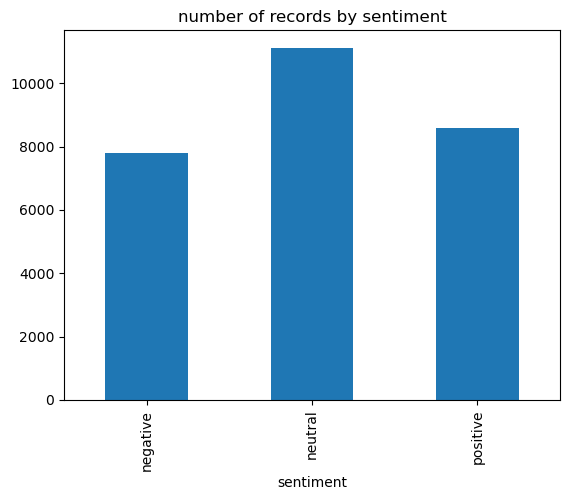

In [116]:
#4. Plot a graf to prepresent a distribution of sentiments over records

plot = dataset.groupby("sentiment").size().plot(kind="bar", title="number of records by sentiment")

#what we can conclude? how many records are there for each sentiment? is this good dataset for prediction?

In [117]:
#5. See if you have any null values in your dataset, this can cause problem in accuracy and later in prediction
# If there are any null, we need to get rid of it by deleting it (if there are few) or replacing it

dataset.isnull().sum()

text         1
sentiment    0
dtype: int64

In [118]:
#6. Drop null values with function dropna(), we know they are in columns 'text'

dataset.dropna(subset=['text'], inplace=True)

dataset.isnull().sum()

text         0
sentiment    0
dtype: int64

In [119]:
#7. Creating function to cleaning a text data with regex from punctations, hyperlinks, non-alphabet characters

import re

def cleanTxt(text):
    text = re.sub(r'@\w+|#\w+', '', text) #Removing @mentions
    text = re.sub('RT[\s]+', '', text) #Removing RT
    text = re.sub('/^(?:https?:\/\/)?(?:[^@\n]+@)?(?:www\.)?([^:\/\n?]+)/img', '', text) #Removing hyperlink
    text = re.sub('[^a-zA-Z]', '', text) # remove punctuation
    text = text.lower() #convert to lowercase letters
    #text = re.sub(r'([a-z])\1+', r'\1', text) #remove repeating letters
    return text

In [120]:
#8. Creating a function to tokenize text, clean it from with regex and from stop words

import nltk
nltk.download('punkt')
nltk.download('stopwords')

stopwords = nltk.corpus.stopwords.words('english')

def tokenization_and_cleaning(text):

  #tokenize sentence
  word_tokens = nltk.word_tokenize(text)

  #clean words in sentence
  clean_word_tokens=[]
  for w in word_tokens:
    clean_word_tokens.append(cleanTxt(w))

  #remove stop words
  clean_word_tokens_from_stopwords = [w for w in clean_word_tokens if w.lower() not in stopwords and w.isalpha()]

  return(" ".join(clean_word_tokens_from_stopwords))

[nltk_data] Downloading package punkt to C:\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to C:\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [121]:
#Example of one text being transformed from original form to cleaned

tokenization_and_cleaning('I`d have responded, if I were going')

'responded going'

In [122]:
#9. Apply this process on all tweets - rows in dataset, we have created a new column for cleaned text 'text_cleaned'


dataset['text_cleaned'] = [tokenization_and_cleaning(tweet) for tweet in dataset['text']]

In [123]:
#Now our dataset looks like this

dataset

,text,sentiment,text_cleaned
0,"I`d have responded, if I were going",neutral,responded going
1,Sooo SAD I will miss you here in San Diego!!!,negative,sooo sad miss san diego
2,my boss is bullying me...,negative,boss bullying
3,what interview! leave me alone,negative,interview leave alone
4,"Sons of ****, why couldn`t they put them on t...",negative,sons put releases already bought
...,...,...,...
27476,wish we could come see u on Denver husband l...,negative,wish could come see u denver husband lost job ...
27477,I`ve wondered about rake to. The client has ...,negative,wondered rake client made clear net force devs...
27478,Yay good for both of you. Enjoy the break - y...,positive,yay good enjoy break probably need hectic week...
27479,But it was worth it ****.,positive,worth


In [124]:
#10. Lets now apply Stemmer and see some examples how it works

porter = nltk.PorterStemmer()
lancaster = nltk.LancasterStemmer()

print(porter.stem('responded going'))
print(lancaster.stem('responded going'))

responded go
responded going


In [125]:
#11. Lets now apply Lemmatier and see some examples how it works

nltk.download('wordnet')

lemma = nltk.WordNetLemmatizer()
print(lemma.lemmatize('responded going'))

#Since from this tweet we can see that PorterStemmer worked the best we can use it from now on
#This does not mean the prediction will be better with PorterStemmer
#We can apply all three examples and compare accuracy at the end of the prediction to get better image what works the best

[nltk_data] Downloading package wordnet to C:\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


responded going


In [126]:
#12. Apply PorterStemmer on all tweets - rows in dataset

dataset['text_cleaned'] = [porter.stem(tweet) for tweet in dataset['text_cleaned']]

In [127]:
dataset['text_cleaned'].head()

0                        responded go
1             sooo sad miss san diego
2                          boss bulli
3                interview leave alon
4    sons put releases already bought
Name: text_cleaned, dtype: object

In [128]:
#Now our dataset looks like this

dataset

,text,sentiment,text_cleaned
0,"I`d have responded, if I were going",neutral,responded go
1,Sooo SAD I will miss you here in San Diego!!!,negative,sooo sad miss san diego
2,my boss is bullying me...,negative,boss bulli
3,what interview! leave me alone,negative,interview leave alon
4,"Sons of ****, why couldn`t they put them on t...",negative,sons put releases already bought
...,...,...,...
27476,wish we could come see u on Denver husband l...,negative,wish could come see u denver husband lost job ...
27477,I`ve wondered about rake to. The client has ...,negative,wondered rake client made clear net force devs...
27478,Yay good for both of you. Enjoy the break - y...,positive,yay good enjoy break probably need hectic week...
27479,But it was worth it ****.,positive,worth


['responded', 'go', 'http', 'wwwdothebouncycomsmf', 'shameless', 'plugging', 'best', 'rangers', 'forum', 'earth', 'soooo', 'high', 'much', 'love', 'hopeful', 'reckon', 'chances', 'minimal', 'p', 'never', 'gon', 'na', 'get', 'cake', 'stuff', 'test', 'test', 'lg', 'env', 'he', 'oh', 'marly', 'sorry', 'hope', 'find', 'soon', 'cleaning', 'house', 'family', 'comming', 'later', 'today', 'got', 'ta', 'restart', 'computer', 'thought', 'win', 'supposed', 'put', 'end', 'constant', 'rebooti', 'see', 'wat', 'mean', 'bout', 'follw', 'friidays', 'called', 'lose', 'fllowers', 'friday', 'smh', 'ahhh', 'slept', 'game', 'gon', 'na', 'try', 'best', 'watch', 'tomorrow', 'though', 'hope', 'play', 'armi', 'thats', 'end', 'tears', 'fears', 'vs', 'eric', 'prydz', 'dj', 'hero', 'http', 'bitlyhpbg', 'case', 'wonder', 'really', 'busy', 'today', 'coming', 'adding', 'tons', 'new', 'blogs', 'updates', 'stay', 'tun', 'car', 'happy', 'big', 'big', 'dent', 'boot', 'hoping', 'theyre', 'going', 'write', 'crossing', 'fin

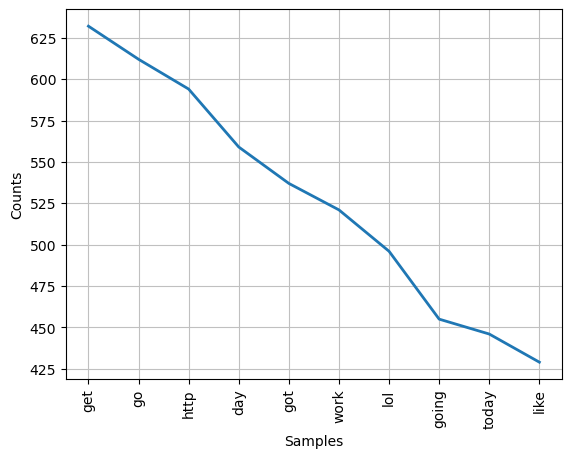

<Axes: xlabel='Samples', ylabel='Counts'>

In [129]:
# Get data about most used words in neutral class

all_tweets_neutral = []

for tweet in dataset[dataset['sentiment']=='neutral']['text_cleaned']:
  for word in nltk.word_tokenize(tweet):
    all_tweets_neutral.append(word)

print(all_tweets_neutral)

nltk.FreqDist(all_tweets_neutral).plot(10)

['sooo', 'sad', 'miss', 'san', 'diego', 'boss', 'bulli', 'interview', 'leave', 'alon', 'sons', 'put', 'releases', 'already', 'bought', 'sharpie', 'running', 'dangerously', 'low', 'ink', 'want', 'go', 'music', 'tonight', 'lost', 'voic', 'uh', 'oh', 'sunburn', 'ok', 'trying', 'plot', 'alternatives', 'speak', 'sigh', 'sick', 'past', 'days', 'thus', 'hair', 'looks', 'wierd', 'didnt', 'hat', 'would', 'look', 'http', 'tinyurlcommnfkw', 'back', 'home', 'gon', 'na', 'miss', 'every', 'on', 'sorri', 'way', 'malaysia', 'internet', 'access', 'twit', 'went', 'sleep', 'power', 'cut', 'noida', 'power', 'back', 'work', 'consolation', 'got', 'bmi', 'tested', 'hahaha', 'says', 'obesed', 'well', 'much', 'unhappy', 'minut', 'born', 'raised', 'nyc', 'living', 'texas', 'past', 'years', 'still', 'miss', 'ni', 'soooooo', 'sleeeeepy', 'last', 'day', 'school', 'today', 'sniffl', 'egh', 'blah', 'boooooooooooo', 'dunno', 'wan', 'na', 'go', 'work', 'hangovers', 'suckkkkkk', 'im', 'drunk', 'mess', 'donbt', 'like', 

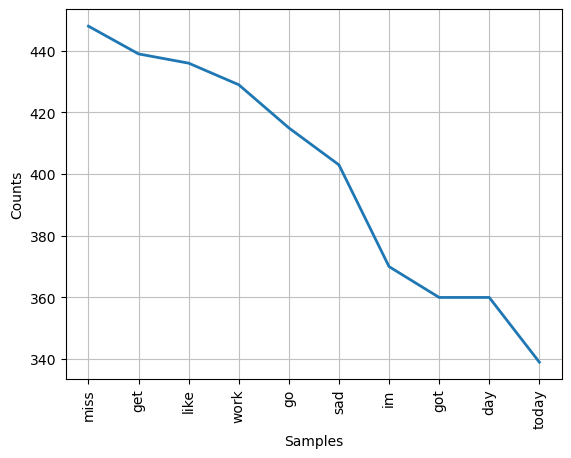

<Axes: xlabel='Samples', ylabel='Counts'>

In [130]:
# Get data about most used words in neutral class

all_tweets_negative = []

for tweet in dataset[dataset['sentiment']=='negative']['text_cleaned']:
  for word in nltk.word_tokenize(tweet):
    all_tweets_negative.append(word)

print(all_tweets_negative)

nltk.FreqDist(all_tweets_negative).plot(10)

['feedings', 'baby', 'fun', 'smiles', 'coo', 'journey', 'wow', 'u', 'became', 'cooler', 'hehe', 'poss', 'really', 'really', 'like', 'song', 'love', 'story', 'taylor', 'swift', 'playing', 'ghost', 'online', 'really', 'interesting', 'new', 'updates', 'kirin', 'pet', 'metamorph', 'third', 'job', 'wait', 'dragon', 'pet', 'free', 'fillin', 'app', 'ipod', 'fun', 'im', 'addict', 'juss', 'came', 'backk', 'berkeleyy', 'omg', 'madd', 'fun', 'havent', 'minute', 'whassqoodd', 'going', 'home', 'seen', 'new', 'twitter', 'design', 'quite', 'heavenli', 'hope', 'unni', 'make', 'audition', 'fighting', 'dahye', 'unni', 'funny', 'cute', 'kid', 'little', 'happy', 'wine', 'jeje', 'ok', 'sm', 'free', 'time', 'cares', 'jaja', 'love', 'day', 'im', 'avid', 'fan', 'magazine', 'love', 'magazin', 'love', 'available', 'pm', 'dear', 'would', 'love', 'help', 'convert', 'vid', 'romance', 'zero', 'funni', 'better', 'way', 'spoil', 'mum', 'let', 'kick', 'back', 'relax', 'nice', 'meal', 'bottle', 'favorite', 'wine', 'win

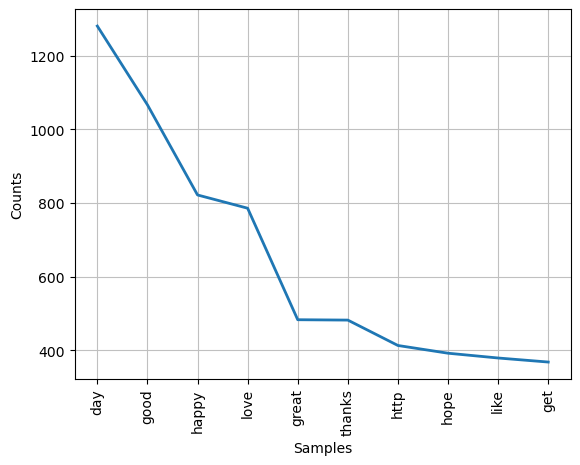

<Axes: xlabel='Samples', ylabel='Counts'>

In [131]:
# Get data about most used words in positive class

all_tweets_positive = []

for tweet in dataset[dataset['sentiment']=='positive']['text_cleaned']:
  for word in nltk.word_tokenize(tweet):
    all_tweets_positive.append(word)

print(all_tweets_positive)

nltk.FreqDist(all_tweets_positive).plot(10)

In [132]:
#Now our dataset looks like this

dataset

,text,sentiment,text_cleaned
0,"I`d have responded, if I were going",neutral,responded go
1,Sooo SAD I will miss you here in San Diego!!!,negative,sooo sad miss san diego
2,my boss is bullying me...,negative,boss bulli
3,what interview! leave me alone,negative,interview leave alon
4,"Sons of ****, why couldn`t they put them on t...",negative,sons put releases already bought
...,...,...,...
27476,wish we could come see u on Denver husband l...,negative,wish could come see u denver husband lost job ...
27477,I`ve wondered about rake to. The client has ...,negative,wondered rake client made clear net force devs...
27478,Yay good for both of you. Enjoy the break - y...,positive,yay good enjoy break probably need hectic week...
27479,But it was worth it ****.,positive,worth


In [133]:
#14. Take the features - 'text_cleaned' column as X variable and class - 'sentiment' column as Y variable

X = dataset['text_cleaned'] #this is our feature in dataset - features
y = dataset['sentiment'] #this is our class label in dataset - label

print(X)
print(y)

0                                             responded go
1                                  sooo sad miss san diego
2                                               boss bulli
3                                     interview leave alon
4                         sons put releases already bought
                               ...                        
27476    wish could come see u denver husband lost job ...
27477    wondered rake client made clear net force devs...
27478    yay good enjoy break probably need hectic week...
27479                                                worth
27480                    flirting going atg smiles yay hug
Name: text_cleaned, Length: 27480, dtype: object
0         neutral
1        negative
2        negative
3        negative
4        negative
           ...   
27476    negative
27477    negative
27478    positive
27479    positive
27480     neutral
Name: sentiment, Length: 27480, dtype: object


In [134]:
#15. Now we need to transform text features into numberic valaues such that we will count occurance of each word in whole dataset for each row

from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

tf = CountVectorizer()
x_tf = tf.fit_transform(X)

# I have created dataframe just for visualization purposes, to show how our dataset looks now it has no value to the prediction

new_dataset = pd.DataFrame(x_tf.toarray(), columns=tf.get_feature_names_out())
new_dataset

,aa,aaa,aaaa,aaaaaaaaaaa,aaaaaaaaaahhhhhhhh,aaaaaaaaaamazing,aaaaaaaafternoon,aaaaaaaahhhhhhhh,aaaaaah,aaaaaahhhhhhhh,...,zumba,zune,zwarte,zwitschert,zxt,zyrtec,zzzz,zzzzy,zzzzzzz,zzzzzzzzzzzzzzz
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27475,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
27476,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
27477,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
27478,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [135]:
#15. Import library from sklearn to divide dataset into train and test sets

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(x_tf, y, test_size = 0.3, stratify = y)

In [136]:
#16. Import RandomForestClassifier from sklearn library and train model with train sets

from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier()
model.fit(X_train,y_train)

RandomForestClassifier()

In [137]:
#Evaluate the accuracy of the model with test datasets

model.score(X_test, y_test)

0.6872877244056284

In [138]:
#With Confusion Matrix visualize the predicted values, which are predicted correct which not

from sklearn.metrics import multilabel_confusion_matrix

y_pred = model.predict(X_test)
cf_matrix = multilabel_confusion_matrix(y_test, y_pred, labels=[1,2,3])
print(cf_matrix)

[[[8244    0]
  [   0    0]]

 [[8244    0]
  [   0    0]]

 [[8244    0]
  [   0    0]]]


C:\Users\Anes\anaconda3\Lib\site-packages\numpy\lib\arraysetops.py:729: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask &= (ar1 != a)


<Axes: >

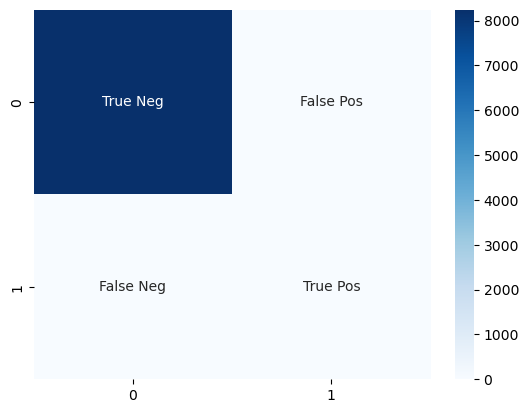

In [139]:
import seaborn as sns
import numpy as np

#Confusion Matrix for first class - neutral

labels = ['True Neg','False Pos','False Neg','True Pos']
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cf_matrix[0], annot=labels, fmt='', cmap='Blues')

<Axes: >

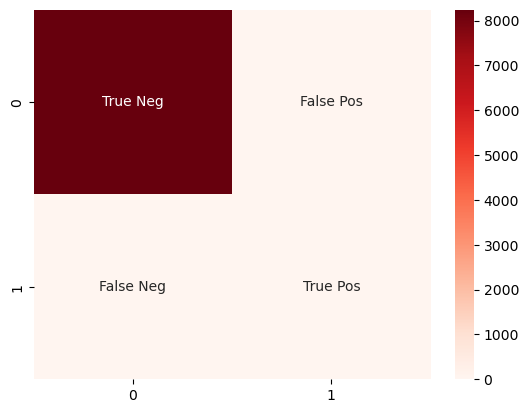

In [140]:
#Confusion Matrix for second class - negative

labels = ['True Neg','False Pos','False Neg','True Pos']
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cf_matrix[1], annot=labels, fmt='', cmap='Reds')

<Axes: >

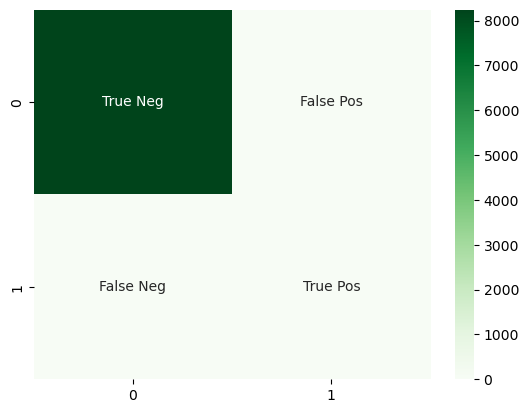

In [141]:
#Confusion Matrix for third class - positive

labels = ['True Neg','False Pos','False Neg','True Pos']
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cf_matrix[2], annot=labels, fmt='', cmap='Greens')

In [142]:
import nltk

In [143]:
def ie_preprocess(document):
    sentences = nltk.sent_tokenize(document)
    sentences = [nltk.word_tokenize(sent) for sent in sentences]
    sentences = [nltk.pos_tag(sent) for sent in sentences]

In [144]:
sentence = [("the", "DT"), ("little", "JJ"), ("yellow", "JJ"),
("dog", "NN"), ("barked", "VBD"), ("at", "IN"), ("the", "DT"), ("cat", "NN")]

grammar = "NP: {<DT>?<JJ>*<NN>}"

cp = nltk.RegexpParser(grammar)

result = cp.parse(sentence)

print(result)

(S
  (NP the/DT little/JJ yellow/JJ dog/NN)
  barked/VBD
  at/IN
  (NP the/DT cat/NN))


In [145]:
result.draw()

In [146]:
grammar = r"""
 NP: {<DT|PP\$>?<JJ>*<NN>} # chunk determiner/possessive, adjectives and nouns
 {<NNP>+} # chunk sequences of proper nouns
"""

In [147]:
cp = nltk.RegexpParser(grammar)
sentence = [("Rapunzel", "NNP"), ("let", "VBD"), ("down", "RP"),
 ("her", "PP$"), ("long", "JJ"), ("golden", "JJ"), ("hair", "NN")]


In [148]:
print(cp.parse(sentence))

(S
  (NP Rapunzel/NNP)
  let/VBD
  down/RP
  (NP her/PP$ long/JJ golden/JJ hair/NN))


In [149]:
nouns = [("money", "NN"), ("market", "NN"), ("fund", "NN")]
grammar = "NP: {<NN><NN>} # Chunk two consecutive nouns"
cp = nltk.RegexpParser(grammar)
print(cp.parse(nouns))


(S (NP money/NN market/NN) fund/NN)


In [150]:
cp = nltk.RegexpParser('CHUNK: {<V.*> <TO> <V.*>}')
brown = nltk.corpus.brown
for sent in brown.tagged_sents():
    tree = cp.parse(sent)
    #print(tree)
    for subtree in tree.subtrees():
        if subtree.label() == 'CHUNK': 
            print(subtree)

(CHUNK combined/VBN to/TO achieve/VB)
(CHUNK continue/VB to/TO place/VB)
(CHUNK serve/VB to/TO protect/VB)
(CHUNK wanted/VBD to/TO wait/VB)
(CHUNK allowed/VBN to/TO place/VB)
(CHUNK expected/VBN to/TO become/VB)
(CHUNK expected/VBN to/TO approve/VB)
(CHUNK expected/VBN to/TO make/VB)
(CHUNK intends/VBZ to/TO make/VB)
(CHUNK seek/VB to/TO set/VB)
(CHUNK like/VB to/TO see/VB)
(CHUNK designed/VBN to/TO provide/VB)
(CHUNK get/VB to/TO hear/VB)
(CHUNK expects/VBZ to/TO tell/VB)
(CHUNK expected/VBN to/TO give/VB)
(CHUNK prefer/VB to/TO pay/VB)
(CHUNK required/VBN to/TO obtain/VB)
(CHUNK permitted/VBN to/TO teach/VB)
(CHUNK designed/VBN to/TO reduce/VB)
(CHUNK Asked/VBN to/TO elaborate/VB)
(CHUNK got/VBN to/TO go/VB)
(CHUNK raised/VBN to/TO pay/VB)
(CHUNK scheduled/VBN to/TO go/VB)
(CHUNK cut/VBN to/TO meet/VB)
(CHUNK needed/VBN to/TO meet/VB)
(CHUNK hastened/VBD to/TO add/VB)
(CHUNK found/VBN to/TO prevent/VB)
(CHUNK continue/VB to/TO insist/VB)
(CHUNK compelled/VBN to/TO make/VB)
(CHUNK mad

(CHUNK tends/VBZ to/TO become/VB)
(CHUNK came/VBD to/TO understand/VB)
(CHUNK deserve/VB to/TO breathe/VB)
(CHUNK advised/VBN to/TO seek/VB)
(CHUNK attempting/VBG to/TO make/VB)
(CHUNK try/VB to/TO gun/VB)
(CHUNK began/VBD to/TO fill/VB)
(CHUNK proposes/VBZ to/TO preserve/VB)
(CHUNK asked/VBN to/TO approve/VB)
(CHUNK seeking/VBG to/TO break/VB)
(CHUNK tends/VBZ to/TO spread/VB)
(CHUNK want/VB to/TO amend/VB)
(CHUNK rejected/VBN to/TO seek/VB)
(CHUNK continued/VBN to/TO speak/VB)
(CHUNK trying/VBG to/TO make/VB)
(CHUNK expected/VBN to/TO head/VB)
(CHUNK tempted/VBN to/TO let/VB)
(CHUNK appear/VB to/TO cost/VB)
(CHUNK attempt/VB to/TO shore/VB)
(CHUNK seeking/VBG to/TO achieve/VB)
(CHUNK expected/VBN to/TO report/VB)
(CHUNK born/VBN to/TO play/VB)
(CHUNK promising/VBG to/TO build/VB)
(CHUNK minded/VBN to/TO read/VB)
(CHUNK hope/VB to/TO win/VB)
(CHUNK threatened/VBD to/TO ignite/VB)
(CHUNK beginning/VBG to/TO take/VB)
(CHUNK flew/VBD to/TO exert/VB)
(CHUNK proceed/VB to/TO validate/VB)
(

(CHUNK determined/VBN to/TO avoid/VB)
(CHUNK seems/VBZ to/TO work/VB)
(CHUNK began/VBD to/TO fall/VB)
(CHUNK began/VBD to/TO depart/VB)
(CHUNK refused/VBD to/TO give/VB)
(CHUNK like/VB to/TO sniff/VB)
(CHUNK continue/VB to/TO demonstrate/VB)
(CHUNK begins/VBZ to/TO wilt/VB)
(CHUNK going/VBG to/TO murder/VB)
(CHUNK trying/VBG to/TO puzzle/VB)
(CHUNK expects/VBZ to/TO profit/VB)
(CHUNK chooses/VBZ to/TO die/VB)
(CHUNK wishes/VBZ to/TO pay/VB)
(CHUNK conditioned/VBN to/TO expect/VB)
(CHUNK hoped/VBD to/TO tell/VB)
(CHUNK refusing/VBG to/TO make/VB)
(CHUNK intended/VBD to/TO stop/VB)
(CHUNK failed/VBD to/TO lead/VB)
(CHUNK need/VB to/TO discipline/VB)
(CHUNK attempts/VBZ to/TO trace/VB)
(CHUNK conspire/VB to/TO defy/VB)
(CHUNK learning/VBG to/TO think/VB)
(CHUNK wants/VBZ to/TO know/VB)
(CHUNK wants/VBZ to/TO supply/VB)
(CHUNK begin/VB to/TO look/VB)
(CHUNK start/VB to/TO think/VB)
(CHUNK attempt/VB to/TO say/VB)
(CHUNK come/VBN to/TO feel/VB)
(CHUNK supposed/VBN to/TO put/VB)
(CHUNK calle

(CHUNK want/VB to/TO throw/VB)
(CHUNK designed/VBN to/TO work/VB)
(CHUNK trying/VBG to/TO prepare/VB)
(CHUNK began/VBD to/TO develop/VB)
(CHUNK used/VBN to/TO suggest/VB)
(CHUNK wanted/VBD to/TO polish/VB)
(CHUNK pays/VBZ to/TO consider/VB)
(CHUNK compelled/VBN to/TO use/VB)
(CHUNK began/VBD to/TO fall/VB)
(CHUNK begun/VBN to/TO write/VB)
(CHUNK made/VBN to/TO seem/VB)
(CHUNK attempting/VBG to/TO direct/VB)
(CHUNK pleased/VBN to/TO call/VB)
(CHUNK scheduled/VBN to/TO nominate/VB)
(CHUNK come/VB to/TO spend/VB)
(CHUNK managed/VBD to/TO irrigate/VB)
(CHUNK stooped/VBD to/TO scoop/VB)
(CHUNK fall/VB to/TO show/VB)
(CHUNK try/VB to/TO push/VB)
(CHUNK begins/VBZ to/TO deteriorate/VB)
(CHUNK used/VBD to/TO like/VB)
(CHUNK offered/VBD to/TO ship/VB)
(CHUNK hopes/VBZ to/TO find/VB)
(CHUNK invented/VBN to/TO hold/VB)
(CHUNK learn/VB to/TO like/VB)
(CHUNK labored/VBD to/TO set/VB)
(CHUNK set/VBN to/TO receive/VB)
(CHUNK entered/VBN to/TO compete/VB)
(CHUNK seem/VB to/TO make/VB)
(CHUNK seemed/VB

(CHUNK prefers/VBZ to/TO adduce/VB)
(CHUNK empowered/VBN to/TO compel/VB)
(CHUNK designed/VBN to/TO prevent/VB)
(CHUNK disposed/VBN to/TO heed/VB)
(CHUNK agree/VB to/TO let/VB)
(CHUNK seeking/VBG to/TO reform/VB)
(CHUNK used/VBD to/TO crowd/VB)
(CHUNK Ask/VB to/TO see/VB)
(CHUNK interested/VBN to/TO learn/VB)
(CHUNK pass/VB to/TO add/VB)
(CHUNK demanding/VBG to/TO know/VB)
(CHUNK seems/VBZ to/TO threaten/VB)
(CHUNK tried/VBD to/TO describe/VB)
(CHUNK tried/VBD to/TO explain/VB)
(CHUNK seem/VB to/TO feel/VB)
(CHUNK got/VBN to/TO play/VB)
(CHUNK ceased/VBN to/TO need/VB)
(CHUNK like/VB to/TO live/VB)
(CHUNK came/VBD to/TO see/VB)
(CHUNK threatens/VBZ to/TO break/VB)
(CHUNK begins/VBZ to/TO fade/VB)
(CHUNK begins/VBZ to/TO appear/VB)
(CHUNK equipped/VBN to/TO tell/VB)
(CHUNK used/VBN to/TO increase/VB)
(CHUNK hired/VBN to/TO repeat/VB)
(CHUNK wished/VBD to/TO make/VB)
(CHUNK seems/VBZ to/TO exist/VB)
(CHUNK means/VBZ to/TO choose/VB)
(CHUNK struggle/VB to/TO insulate/VB)
(CHUNK serves/VBZ

(CHUNK bark/VB to/TO let/VB)
(CHUNK dash/VB to/TO get/VB)
(CHUNK tried/VBD to/TO talk/VB)
(CHUNK decided/VBD to/TO leave/VB)
(CHUNK used/VBD to/TO tell/VB)
(CHUNK continue/VB to/TO reflect/VB)
(CHUNK appear/VB to/TO preach/VB)
(CHUNK intend/VB to/TO let/VB)
(CHUNK need/VB to/TO test/VB)
(CHUNK learned/VBD to/TO meet/VB)
(CHUNK said/VBN to/TO give/VB)
(CHUNK serves/VBZ to/TO reduce/VB)
(CHUNK thought/VBN to/TO provide/VB)
(CHUNK tends/VBZ to/TO give/VB)
(CHUNK wish/VB to/TO deny/VB)
(CHUNK expect/VB to/TO find/VB)
(CHUNK seek/VB to/TO capture/VB)
(CHUNK allowed/VBN to/TO claim/VB)
(CHUNK seeks/VBZ to/TO recapture/VB)
(CHUNK determined/VBN to/TO bulldoze/VB)
(CHUNK sought/VBD to/TO run/VB)
(CHUNK needed/VBD to/TO make/VB)
(CHUNK hurry/VB to/TO catch/VB)
(CHUNK planned/VBD to/TO bolt/VB)
(CHUNK fit/VBN to/TO nominate/VB)
(CHUNK intend/VB to/TO support/VB)
(CHUNK refusing/VBG to/TO abandon/VB)
(CHUNK begun/VBN to/TO parallel/VB)
(CHUNK help/VB to/TO give/VB)
(CHUNK fail/VB to/TO convey/VB)

(CHUNK tending/VBG to/TO separate/VB)
(CHUNK established/VBN to/TO gather/VB)
(CHUNK used/VBN to/TO study/VB)
(CHUNK used/VBN to/TO measure/VB)
(CHUNK used/VBN to/TO calculate/VB)
(CHUNK directed/VBN to/TO mail/VB)
(CHUNK offers/VBZ to/TO pay/VB)
(CHUNK promises/VBZ to/TO pay/VB)
(CHUNK construed/VBN to/TO limit/VB)
(CHUNK directed/VBN to/TO pay/VB)
(CHUNK directed/VBN to/TO cover/VB)
(CHUNK failed/VBN to/TO offer/VB)
(CHUNK intends/VBZ to/TO pursue/VB)
(CHUNK helping/VBG to/TO create/VB)
(CHUNK wish/VB to/TO merge/VB)
(CHUNK pleased/VBN to/TO note/VB)
(CHUNK continue/VB to/TO serve/VB)
(CHUNK pleased/VBN to/TO note/VB)
(CHUNK inclined/VBN to/TO drag/VB)
(CHUNK trying/VBG to/TO get/VB)
(CHUNK made/VBN to/TO enlist/VB)
(CHUNK try/VB to/TO run/VB)
(CHUNK designed/VBN to/TO help/VB)
(CHUNK designed/VBN to/TO reflect/VB)
(CHUNK designed/VBN to/TO avoid/VB)
(CHUNK designed/VBN to/TO reflect/VB)
(CHUNK required/VBN to/TO help/VB)
(CHUNK working/VBG to/TO develop/VB)
(CHUNK installed/VBN to/T

(CHUNK asked/VBN to/TO learn/VB)
(CHUNK prefer/VB to/TO test/VB)
(CHUNK told/VBN to/TO purchase/VB)
(CHUNK seemed/VBD to/TO antagonize/VB)
(CHUNK designed/VBN to/TO develop/VB)
(CHUNK refused/VBD to/TO change/VB)
(CHUNK refused/VBD to/TO change/VB)
(CHUNK refused/VBD to/TO accept/VB)
(CHUNK supposed/VBN to/TO know/VB)
(CHUNK working/VBG to/TO become/VB)
(CHUNK led/VBN to/TO see/VB)
(CHUNK asked/VBN to/TO vote/VB)
(CHUNK duplicated/VBN to/TO form/VB)
(CHUNK learn/VB to/TO play/VB)
(CHUNK want/VB to/TO change/VB)
(CHUNK learns/VBZ to/TO become/VB)
(CHUNK began/VBD to/TO emerge/VB)
(CHUNK used/VBD to/TO annoy/VB)
(CHUNK stooping/VBG to/TO dispense/VB)
(CHUNK come/VBN to/TO see/VB)
(CHUNK preferred/VBD to/TO keep/VB)
(CHUNK used/VBD to/TO give/VB)
(CHUNK came/VBD to/TO feel/VB)
(CHUNK used/VBN to/TO accomplish/VB)
(CHUNK found/VBN to/TO match/VB)
(CHUNK required/VBN to/TO store/VB)
(CHUNK saved/VBN to/TO represent/VB)
(CHUNK saved/VBN to/TO represent/VB)
(CHUNK created/VBN to/TO accommodat

(CHUNK served/VBN to/TO overheat/VB)
(CHUNK seemed/VBD to/TO crouch/VB)
(CHUNK seemed/VBD to/TO advance/VB)
(CHUNK seemed/VBD to/TO resist/VB)
(CHUNK began/VBD to/TO write/VB)
(CHUNK refuse/VB to/TO mention/VB)
(CHUNK needed/VBD to/TO eat/VB)
(CHUNK wanting/VBG to/TO know/VB)
(CHUNK stop/VB to/TO grasp/VB)
(CHUNK dared/VBN to/TO defy/VB)
(CHUNK hoping/VBG to/TO store/VB)
(CHUNK going/VBG to/TO get/VB)
(CHUNK want/VB to/TO get/VB)
(CHUNK trying/VBG to/TO talk/VB)
(CHUNK determined/VBD to/TO go/VB)
(CHUNK proposed/VBN to/TO rebuild/VB)
(CHUNK going/VBG to/TO stay/VB)
(CHUNK plan/VB to/TO repair/VB)
(CHUNK Hope/VB to/TO see/VB)
(CHUNK used/VBD to/TO take/VB)
(CHUNK want/VB to/TO kill/VB)
(CHUNK intend/VB to/TO go/VB)
(CHUNK wanted/VBN to/TO hurt/VB)
(CHUNK bother/VB to/TO think/VB)
(CHUNK delighted/VBN to/TO see/VB)
(CHUNK began/VBD to/TO weep/VB)
(CHUNK began/VBD to/TO move/VB)
(CHUNK tried/VBD to/TO push/VB)
(CHUNK tried/VBD to/TO rescue/VB)
(CHUNK seemed/VBD to/TO hold/VB)
(CHUNK began

(CHUNK supposed/VBN to/TO make/VB)
(CHUNK wants/VBZ to/TO ask/VB)
(CHUNK decided/VBD to/TO let/VB)
(CHUNK got/VBN to/TO go/VB)
(CHUNK tried/VBD to/TO ignore/VB)
(CHUNK going/VBG to/TO keep/VB)
(CHUNK startled/VBN to/TO meet/VB)
(CHUNK came/VBD to/TO examine/VB)
(CHUNK tried/VBD to/TO bring/VB)
(CHUNK reaching/VBG to/TO release/VB)
(CHUNK waiting/VBG to/TO report/VB)
(CHUNK used/VBD to/TO paint/VB)
(CHUNK Begin/VB to/TO look/VB)
(CHUNK wanted/VBD to/TO see/VB)
(CHUNK Failing/VBG to/TO find/VB)
(CHUNK Try/VB to/TO forget/VB)
(CHUNK seen/VBN to/TO leave/VB)
(CHUNK forced/VBN to/TO give/VB)
(CHUNK inclined/VBN to/TO admit/VB)
(CHUNK began/VBD to/TO make/VB)
(CHUNK professed/VBD to/TO know/VB)
(CHUNK asked/VBD to/TO use/VB)
(CHUNK leaving/VBG to/TO keep/VB)
(CHUNK fit/VBN to/TO consult/VB)
(CHUNK asked/VBD to/TO see/VB)
(CHUNK wanted/VBD to/TO make/VB)
(CHUNK continued/VBD to/TO discharge/VB)
(CHUNK seem/VB to/TO belong/VB)
(CHUNK began/VBD to/TO flicker/VB)
(CHUNK trying/VBG to/TO wreck/VB

(CHUNK struggled/VBD to/TO control/VB)
(CHUNK deserved/VBD to/TO live/VB)
(CHUNK like/VB to/TO hunt/VB)
(CHUNK left/VBN to/TO say/VB)
(CHUNK like/VB to/TO recognize/VB)
(CHUNK wanting/VBG to/TO fly/VB)
(CHUNK dispatched/VBN to/TO harry/VB)
(CHUNK started/VBD to/TO buckle/VB)
(CHUNK began/VBD to/TO crawl/VB)
(CHUNK wanted/VBD to/TO lose/VB)
(CHUNK going/VBG to/TO show/VB)
(CHUNK going/VBG to/TO give/VB)
(CHUNK trying/VBG to/TO size/VB)
(CHUNK seemed/VBD to/TO promise/VB)
(CHUNK hate/VB to/TO run/VB)
(CHUNK turned/VBD to/TO face/VB)
(CHUNK wish/VB to/TO enter/VB)
(CHUNK intend/VB to/TO speak/VB)
(CHUNK determined/VBN to/TO make/VB)
(CHUNK want/VB to/TO upset/VB)
(CHUNK resolved/VBD to/TO make/VB)
(CHUNK left/VBN to/TO distract/VB)
(CHUNK vied/VBN to/TO knock/VB)
(CHUNK equipped/VBN to/TO die/VB)
(CHUNK tried/VBD to/TO roll/VB)
(CHUNK commenced/VBD to/TO weep/VB)
(CHUNK began/VBD to/TO uncap/VB)
(CHUNK going/VBG to/TO get/VB)
(CHUNK expected/VBN to/TO risk/VB)
(CHUNK decided/VBD to/TO set

(CHUNK want/VB to/TO hear/VB)
(CHUNK trying/VBG to/TO get/VB)
(CHUNK forgot/VBD to/TO say/VB)
(CHUNK seemed/VBD to/TO believe/VB)
(CHUNK wanted/VBN to/TO get/VB)
(CHUNK wanted/VBD to/TO see/VB)
(CHUNK wanted/VBD to/TO touch/VB)
(CHUNK got/VBN to/TO entertain/VB)
(CHUNK tried/VBD to/TO keep/VB)
(CHUNK going/VBG to/TO tell/VB)
(CHUNK thought/VBN to/TO mix/VB)
(CHUNK going/VBG to/TO jump/VB)
(CHUNK beginning/VBG to/TO catch/VB)
(CHUNK try/VB to/TO see/VB)
(CHUNK phoned/VBD to/TO say/VB)
(CHUNK bothering/VBG to/TO look/VB)
(CHUNK forced/VBN to/TO wipe/VB)
(CHUNK used/VBD to/TO pretend/VB)
(CHUNK refused/VBD to/TO approach/VB)
(CHUNK used/VBN to/TO express/VB)
(CHUNK proceeds/VBZ to/TO lash/VB)
(CHUNK used/VBD to/TO hang/VB)
(CHUNK seeks/VBZ to/TO expunge/VB)
(CHUNK trying/VBG to/TO redeem/VB)
(CHUNK seemed/VBD to/TO take/VB)
(CHUNK tried/VBD to/TO conceal/VB)
(CHUNK came/VBD to/TO know/VB)
(CHUNK refuses/VBZ to/TO continue/VB)
(CHUNK given/VBN to/TO understand/VB)
(CHUNK propose/VB to/TO v

In [151]:
grammar = r"""
 NP: {<DT|PP\$>?<JJ>*<NN>} # chunk determiner/possessive, adjectives and nouns
 {<NNP>+} # chunk sequences of proper nouns
"""
cp = nltk.RegexpParser(grammar)
sentence = [("Rapunzel", "NNP"), ("let", "VBD"), ("down", "RP"),
 ("her", "PP$"), ("long", "JJ"), ("golden", "JJ"), ("hair", "NN")]

print(cp.parse(sentence))

(S
  (NP Rapunzel/NNP)
  let/VBD
  down/RP
  (NP her/PP$ long/JJ golden/JJ hair/NN))


In [152]:
nouns = [("money", "NN"), ("market", "NN"), ("fund", "NN")]
grammar = "NP: {<NN><NN>} # Chunk two consecutive nouns"
cp = nltk.RegexpParser(grammar)
print(cp.parse(nouns))

(S (NP money/NN market/NN) fund/NN)


In [153]:
grammar = r"""
 NP:
 {<.*>+} # Chunk everything
 }<VBD|IN|NN>+{ # Chink sequences of VBD and IN
 """
sentence = [("the", "DT"), ("little", "JJ"), ("yellow", "JJ"),
 ("dog", "NN"), ("barked", "VBD"), ("at", "IN"), ("the", "DT"), ("cat", "NN")]
cp = nltk.RegexpParser(grammar)
print(cp.parse(sentence))

(S
  (NP the/DT little/JJ yellow/JJ)
  dog/NN
  barked/VBD
  at/IN
  (NP the/DT)
  cat/NN)


In [154]:
text = '''
he PRP B-NP
accepted VBD B-VP
the DT B-NP
position NN I-NP
of IN B-PP
vice NN B-NP
chairman NN I-NP
of IN B-PP
Carlyle NNP B-NP
Group NNP I-NP
, , O
a DT B-NP
merchant NN I-NP
banking NN I-NP
concern NN I-NP
. . O
'''
nltk.chunk.conllstr2tree(text, chunk_types=['NP']).draw()



In [155]:
from nltk.corpus import conll2000
print(conll2000.chunked_sents('train.txt')[99])

(S
  (PP Over/IN)
  (NP a/DT cup/NN)
  (PP of/IN)
  (NP coffee/NN)
  ,/,
  (NP Mr./NNP Stone/NNP)
  (VP told/VBD)
  (NP his/PRP$ story/NN)
  ./.)


In [156]:
print(conll2000.chunked_sents('train.txt', chunk_types=['NP'])[99])

(S
  Over/IN
  (NP a/DT cup/NN)
  of/IN
  (NP coffee/NN)
  ,/,
  (NP Mr./NNP Stone/NNP)
  told/VBD
  (NP his/PRP$ story/NN)
  ./.)


In [157]:
grammar = r"""
 NP: {<DT|JJ|NN.*>+} # Chunk sequences of DT, JJ, NN
 PP: {<IN><NP>} # Chunk prepositions followed by NP
 VP: {<VB.*><NP|PP|CLAUSE>+$} # Chunk verbs and their arguments
 CLAUSE: {<NP><VP>} # Chunk NP, VP
 """
cp = nltk.RegexpParser(grammar)
sentence = [("Mary", "NN"), ("saw", "VBD"), ("the", "DT"), ("cat", "NN"),
 ("sit", "VB"), ("on", "IN"), ("the", "DT"), ("mat", "NN")]
print(cp.parse(sentence))

(S
  (NP Mary/NN)
  saw/VBD
  (CLAUSE
    (NP the/DT cat/NN)
    (VP sit/VB (PP on/IN (NP the/DT mat/NN)))))


In [158]:
sentence = [("John", "NNP"), ("thinks", "VBZ"), ("Mary", "NN"),
("saw", "VBD"), ("the", "DT"), ("cat", "NN"), ("sit", "VB"),
("on", "IN"), ("the", "DT"), ("mat", "NN")]
print(cp.parse(sentence))

(S
  (NP John/NNP)
  thinks/VBZ
  (NP Mary/NN)
  saw/VBD
  (CLAUSE
    (NP the/DT cat/NN)
    (VP sit/VB (PP on/IN (NP the/DT mat/NN)))))


In [159]:
cp = nltk.RegexpParser(grammar, loop=2)
print(cp.parse(sentence))

(S
  (NP John/NNP)
  thinks/VBZ
  (CLAUSE
    (NP Mary/NN)
    (VP
      saw/VBD
      (CLAUSE
        (NP the/DT cat/NN)
        (VP sit/VB (PP on/IN (NP the/DT mat/NN)))))))


In [160]:
tree1 = nltk.Tree('NP', ['Alice'])
print(tree1)

(NP Alice)


In [161]:
tree2 = nltk.Tree('NP', ['the', 'rabbit'])
print(tree2)

(NP the rabbit)


In [162]:
tree3 = nltk.Tree('VP', ['chased', tree2])
tree4 = nltk.Tree('S', [tree1, tree3])
print(tree4)

(S (NP Alice) (VP chased (NP the rabbit)))


In [163]:
print(tree4[1])

(VP chased (NP the rabbit))


In [166]:
print(tree4[-1])

(VP chased (NP the rabbit))


In [167]:
print(tree4[-2].label())

NP


In [168]:
tree4.leaves()

['Alice', 'chased', 'the', 'rabbit']

In [169]:
tree4[1][1][1]

'rabbit'

In [170]:
tree4.draw()

In [171]:
nltk.download('maxent_ne_chunker')
sent = nltk.corpus.treebank.tagged_sents()[22]
print(nltk.ne_chunk(sent, binary=True))

[nltk_data] Downloading package maxent_ne_chunker to C:\nltk_data...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!


(S
  The/DT
  (NE U.S./NNP)
  is/VBZ
  one/CD
  of/IN
  the/DT
  few/JJ
  industrialized/VBN
  nations/NNS
  that/WDT
  *T*-7/-NONE-
  does/VBZ
  n't/RB
  have/VB
  a/DT
  higher/JJR
  standard/NN
  of/IN
  regulation/NN
  for/IN
  the/DT
  smooth/JJ
  ,/,
  needle-like/JJ
  fibers/NNS
  such/JJ
  as/IN
  crocidolite/NN
  that/WDT
  *T*-1/-NONE-
  are/VBP
  classified/VBN
  *-5/-NONE-
  as/IN
  amphobiles/NNS
  ,/,
  according/VBG
  to/TO
  (NE Brooke/NNP)
  T./NNP
  Mossman/NNP
  ,/,
  a/DT
  professor/NN
  of/IN
  pathlogy/NN
  at/IN
  the/DT
  (NE University/NNP)
  of/IN
  (NE Vermont/NNP College/NNP)
  of/IN
  (NE Medicine/NNP)
  ./.)


In [172]:
print(nltk.ne_chunk(sent))

(S
  The/DT
  (GPE U.S./NNP)
  is/VBZ
  one/CD
  of/IN
  the/DT
  few/JJ
  industrialized/VBN
  nations/NNS
  that/WDT
  *T*-7/-NONE-
  does/VBZ
  n't/RB
  have/VB
  a/DT
  higher/JJR
  standard/NN
  of/IN
  regulation/NN
  for/IN
  the/DT
  smooth/JJ
  ,/,
  needle-like/JJ
  fibers/NNS
  such/JJ
  as/IN
  crocidolite/NN
  that/WDT
  *T*-1/-NONE-
  are/VBP
  classified/VBN
  *-5/-NONE-
  as/IN
  amphobiles/NNS
  ,/,
  according/VBG
  to/TO
  (PERSON Brooke/NNP T./NNP Mossman/NNP)
  ,/,
  a/DT
  professor/NN
  of/IN
  pathlogy/NN
  at/IN
  the/DT
  (ORGANIZATION University/NNP)
  of/IN
  (PERSON Vermont/NNP College/NNP)
  of/IN
  (GPE Medicine/NNP)
  ./.)


In [173]:
import re
IN = re.compile(r'.*\bin\b(?!\b.+ing)')


In [174]:
import nltk
nltk.download('ieer')
for doc in nltk.corpus.ieer.parsed_docs('NYT_19980315'):
    for rel in nltk.sem.extract_rels('ORG', 'LOC', doc, corpus='ieer', pattern = IN):
        print(nltk.sem.rtuple(rel))

[ORG: 'WHYY'] 'in' [LOC: 'Philadelphia']
[ORG: 'McGlashan &AMP; Sarrail'] 'firm in' [LOC: 'San Mateo']
[ORG: 'Freedom Forum'] 'in' [LOC: 'Arlington']
[ORG: 'Brookings Institution'] ', the research group in' [LOC: 'Washington']
[ORG: 'Idealab'] ', a self-described business incubator based in' [LOC: 'Los Angeles']
[ORG: 'Open Text'] ', based in' [LOC: 'Waterloo']
[ORG: 'WGBH'] 'in' [LOC: 'Boston']
[ORG: 'Bastille Opera'] 'in' [LOC: 'Paris']
[ORG: 'Omnicom'] 'in' [LOC: 'New York']
[ORG: 'DDB Needham'] 'in' [LOC: 'New York']
[ORG: 'Kaplan Thaler Group'] 'in' [LOC: 'New York']
[ORG: 'BBDO South'] 'in' [LOC: 'Atlanta']
[ORG: 'Georgia-Pacific'] 'in' [LOC: 'Atlanta']


[nltk_data] Downloading package ieer to C:\nltk_data...
[nltk_data]   Package ieer is already up-to-date!


In [175]:
#Write a tag pattern to match noun phrases containing plural head nouns, 
#e.g., many/JJ researchers/NNS, two/CD weeks/NNS, both/DT 
#new/JJ positions/NNS. 
#Try to do this by generalizing the tag pattern that handled singular 
#noun phrases.

import nltk
import re
import pprint
from nltk import word_tokenize, pos_tag


textchunk = [("many", "JJ"), ("researchers", "NNS"), ("two", "CD"), ("weeks", "NNS"), ("both","DT"), ("new", "JJ"), ("positions", "NNS")]
corpus = nltk.RegexpParser("NP:{<DT>?<CD>?<JJ>*<NNS>}")
corpus.parse(textchunk).draw()

In [176]:
# Pick one of the three chunk types in the CoNLL-2000 Chunking Corpus. 
# Inspect the data and try to observe any patterns in the POS tag 
# sequences that make up this kind of chunk. 
# Develop a simple chunker using the regular expression 
# chunker nltk.RegexpParser. Discuss any tag sequences that are difficult 
#to chunk reliably.


from nltk.corpus import conll2000
for i in range(20):
    print(i, conll2000.chunked_sents('train.txt', chunk_types = ['VP'])[i])
grammar = r"VP: {<[VRMT].*>+}"
cp = nltk.RegexpParser(grammar)
test_sents = conll2000.chunked_sents('test.txt', chunk_types = ['VP'])
print(cp.evaluate(test_sents))


0 (S
  Confidence/NN
  in/IN
  the/DT
  pound/NN
  (VP is/VBZ widely/RB expected/VBN to/TO take/VB)
  another/DT
  sharp/JJ
  dive/NN
  if/IN
  trade/NN
  figures/NNS
  for/IN
  September/NNP
  ,/,
  due/JJ
  for/IN
  release/NN
  tomorrow/NN
  ,/,
  (VP fail/VB to/TO show/VB)
  a/DT
  substantial/JJ
  improvement/NN
  from/IN
  July/NNP
  and/CC
  August/NNP
  's/POS
  near-record/JJ
  deficits/NNS
  ./.)
1 (S
  Chancellor/NNP
  of/IN
  the/DT
  Exchequer/NNP
  Nigel/NNP
  Lawson/NNP
  's/POS
  restated/VBN
  commitment/NN
  to/TO
  a/DT
  firm/NN
  monetary/JJ
  policy/NN
  (VP has/VBZ helped/VBN to/TO prevent/VB)
  a/DT
  freefall/NN
  in/IN
  sterling/NN
  over/IN
  the/DT
  past/JJ
  week/NN
  ./.)
2 (S
  But/CC
  analysts/NNS
  (VP reckon/VBP)
  underlying/VBG
  support/NN
  for/IN
  sterling/NN
  (VP has/VBZ been/VBN eroded/VBN)
  by/IN
  the/DT
  chancellor/NN
  's/POS
  failure/NN
  (VP to/TO announce/VB)
  any/DT
  new/JJ
  policy/NN
  measures/NNS
  in/IN
  his/PRP$
  Mansio

C:\Users\Anes\AppData\Local\Temp\ipykernel_18852\2632239089.py:15: DeprecationWarning: 
  Function evaluate() has been deprecated.  Use accuracy(gold)
  instead.
  print(cp.evaluate(test_sents))


ChunkParse score:
    IOB Accuracy:  94.3%%
    Precision:     64.2%%
    Recall:        80.4%%
    F-Measure:     71.4%%


In [177]:
# Write a tag pattern to cover noun phrases that contain gerunds, 
# e.g., the/DT receiving/VBG end/NN, assistant/NN managing/VBG editor/NN. 
# Add these patterns to the grammar, one per line. 
# Test your work using some tagged sentences of your own devising.

import nltk
textchunk = [("the", "DT"), ("receiving", "VBG"), ("end","NN"), ("assistant", "NN"), ("managing","VBG"), ("editor", "NN")]
corpus = nltk.RegexpParser("Gerunds: {<DT>?<NN>?<VBG><NN>}")
corpus.parse(textchunk).draw()

In [178]:
# Develop a chunker for one of the chunk types in the CoNLL Chunking 
# Corpus using a regular expression–based chunk grammar RegexpChunk. 
# Use any combination of rules for chunking, chinking, merging, or splitting.

import nltk
from nltk.chunk import RegexpParser
from nltk import Tree

# Define the regular expression-based chunk grammar
chunk_grammar = r"""
    NP: {<DT>?<JJ>*<NN>}  # Chunk NP (noun phrase)
    VP: {<VB.*><NP|PP>*}  # Chunk VP (verb phrase) with optional NP or PP
    PP: {<IN><NP>}        # Chunk PP (prepositional phrase)
"""

# Create a chunk parser with the defined grammar
chunk_parser = RegexpParser(chunk_grammar)

# Example sentence to test the chunker
sentence = [("The", "DT"), ("quick", "JJ"), ("brown", "NN"), ("fox", "NN"),
            ("jumps", "VBZ"), ("over", "IN"), ("the", "DT"), ("lazy", "JJ"), ("dog", "NN")]

# Parse the sample sentence and display the result
result = chunk_parser.parse(sentence)
result.pretty_print()

result.draw()
# Convert the result to a tree and display it
tree = Tree.fromstring(str(result))
tree.pretty_print()


                                    S                                      
           _________________________|_____________________                  
          |                |        |                     PP               
          |                |        |         ____________|_____            
          NP               NP       VP       |                  NP         
   _______|________        |        |        |       ___________|______     
The/DT quick/JJ brown/NN fox/NN jumps/VBZ over/IN the/DT     lazy/JJ dog/NN

                                    S                                      
           _________________________|_____________________                  
          |                |        |                     PP               
          |                |        |         ____________|_____            
          NP               NP       VP       |                  NP         
   _______|________        |        |        |       ___________|______     
The/D

In [179]:
#1. Write a tag pattern to match noun phrases containing plural
#head nouns, e.g., many/JJ researchers/NNS, two/CD weeks/NNS,
#both/DT new/JJ positions/NNS. Try to do this by generalizing
#the tag pattern that handled singular noun phrases.

import nltk
import re
from nltk import word_tokenize, pos_tag

textchunk = [("many", "JJ"), ("researchers", "NNS"), ("two", "CD"), ("weeks", "NNS"), ("both","DT"), ("new", "JJ"), ("positions", "NNS")]
corpus = nltk.RegexpParser("NP:{<DT>?<CD>?<JJ>*<NNS>}")

print(corpus.parse(textchunk))
for chunk in corpus.parse(textchunk):
    print(chunk)


(S
  (NP many/JJ researchers/NNS)
  (NP two/CD weeks/NNS)
  (NP both/DT new/JJ positions/NNS))
(NP many/JJ researchers/NNS)
(NP two/CD weeks/NNS)
(NP both/DT new/JJ positions/NNS)


Chunking involves grouping together individual pieces of information from a sentence, such as nouns, verbs, adjectives, and adverbs, into larger units known as chunks. The most common type of chunking is noun phrase (NP) chunking, which involves identifying and extracting noun phrases from a sentence, such as "the cat," "a book," or "my friend." Another type of chunking is verb phrase (VP) chunking, which involves identifying and extracting verb phrases from a sentence, such as "ate breakfast," "is running," or "will sing."

Noun phrases are part of speech patterns that include a noun. They can also include whatever other parts of speech make grammatical sense, and can include multiple nouns. Some common noun phrase patterns are:

    Noun
    Noun-Noun..… -Noun
    Adjective(s)-Noun
    Verb-(Adjectives-)Noun

A noun phrase consists of a noun or pronoun, which is called the head, and any dependent words before or after the head.

Chunking are important techniques in NLP because they allow us to extract meaningful information from text data. By identifying and grouping together chunks of information, we can analyze patterns and relationships within the text and extract relevant insights.

POS Example

CC coordinating conjunction and
CD cardinal number 1, third
DT determiner the
EX existential there there is
FW foreign word d’hoevre
IN preposition/subordinating conjunction in, of, like
JJ adjective big
JJR adjective, comparative bigger
JJS adjective, superlative biggest
LS list marker 1)
MD modal could, will
NN noun, singular or mass door
NNS noun plural doors
NNP proper noun, singular John
NNPS proper noun, plural Vikings
PDT predeterminer both the boys
POS possessive ending friend's
PRP personal pronoun I, he, it
RB adverb however, usually, naturally, here, good
RBR adverb, comparative better
RBS adverb, superlative best
RP particle give up
TO to to go, to him
UH interjection uhhuhhuhh
VB verb, base form take
VBD verb, past tense took
VBG verb, gerund/present participle taking
VBN verb, past participle taken
VBP verb, sing. present, non-3d take
VBZ verb, 3rd person sing. present takes
WDT wh-determiner which
WP wh-pronoun who, what
WP$ possessive wh-pronoun whose
WRB wh-abverb where, when

In [181]:
#Pick one of the three chunk types in the CoNLL-2000 Chunking Corpus.
#Inspect the data and try to observe any patterns in the POS tag sequences
#that make up this kind of chunk. Develop a simple chunker using the regular
#expression chunker nltk.RegexpParser. Discuss any tag sequences that are difficult to chunk reliably.

nltk.download('conll2000')
from nltk.corpus import conll2000

for i in range(20):
    print(i, conll2000.chunked_sents('train.txt', chunk_types = ['NP'])[i])

0 (S
  (NP Confidence/NN)
  in/IN
  (NP the/DT pound/NN)
  is/VBZ
  widely/RB
  expected/VBN
  to/TO
  take/VB
  (NP another/DT sharp/JJ dive/NN)
  if/IN
  (NP trade/NN figures/NNS)
  for/IN
  (NP September/NNP)
  ,/,
  due/JJ
  for/IN
  (NP release/NN)
  (NP tomorrow/NN)
  ,/,
  fail/VB
  to/TO
  show/VB
  (NP a/DT substantial/JJ improvement/NN)
  from/IN
  (NP July/NNP and/CC August/NNP)
  (NP 's/POS near-record/JJ deficits/NNS)
  ./.)
1 (S
  Chancellor/NNP
  of/IN
  (NP the/DT Exchequer/NNP)
  (NP Nigel/NNP Lawson/NNP)
  (NP 's/POS restated/VBN commitment/NN)
  to/TO
  (NP a/DT firm/NN monetary/JJ policy/NN)
  has/VBZ
  helped/VBN
  to/TO
  prevent/VB
  (NP a/DT freefall/NN)
  in/IN
  (NP sterling/NN)
  over/IN
  (NP the/DT past/JJ week/NN)
  ./.)
2 (S
  But/CC
  (NP analysts/NNS)
  reckon/VBP
  (NP underlying/VBG support/NN)
  for/IN
  (NP sterling/NN)
  has/VBZ
  been/VBN
  eroded/VBN
  by/IN
  (NP the/DT chancellor/NN)
  (NP 's/POS failure/NN)
  to/TO
  announce/VB
  (NP any/DT n

[nltk_data] Downloading package conll2000 to C:\nltk_data...
[nltk_data]   Package conll2000 is already up-to-date!


In [182]:
grammar = r"VP: {<[VRMT].*>+}" # {<VB.>?<RB>*<MD>?<VB.>?<TO>?<VB.>} or {<VB.>?<RB.>*<MD>?<VB.>?<TO>?<VB.>} or {<VB.>?<RB>*<MD>?<VB.>?<TO>?<MD>?<RB>*<VB.>}
cp = nltk.RegexpParser(grammar)

for i in range(20):
  test_sent =  conll2000.chunked_sents('train.txt', chunk_types = ['VP'])[i]
  print(i, print(cp.parse(test_sent)))

(S
  Confidence/NN
  in/IN
  the/DT
  pound/NN
  (VP (VP is/VBZ widely/RB expected/VBN to/TO take/VB))
  another/DT
  sharp/JJ
  dive/NN
  if/IN
  trade/NN
  figures/NNS
  for/IN
  September/NNP
  ,/,
  due/JJ
  for/IN
  release/NN
  tomorrow/NN
  ,/,
  (VP (VP fail/VB to/TO show/VB))
  a/DT
  substantial/JJ
  improvement/NN
  from/IN
  July/NNP
  and/CC
  August/NNP
  's/POS
  near-record/JJ
  deficits/NNS
  ./.)
0 None
(S
  Chancellor/NNP
  of/IN
  the/DT
  Exchequer/NNP
  Nigel/NNP
  Lawson/NNP
  's/POS
  (VP restated/VBN)
  commitment/NN
  (VP to/TO)
  a/DT
  firm/NN
  monetary/JJ
  policy/NN
  (VP (VP has/VBZ helped/VBN to/TO prevent/VB))
  a/DT
  freefall/NN
  in/IN
  sterling/NN
  over/IN
  the/DT
  past/JJ
  week/NN
  ./.)
1 None
(S
  But/CC
  analysts/NNS
  (VP (VP reckon/VBP) underlying/VBG)
  support/NN
  for/IN
  sterling/NN
  (VP (VP has/VBZ been/VBN eroded/VBN))
  by/IN
  the/DT
  chancellor/NN
  's/POS
  failure/NN
  (VP (VP to/TO announce/VB))
  any/DT
  new/JJ
  policy

In [183]:
#Write a tag pattern to cover noun phrases that contain gerunds,
#e.g., the/DT receiving/VBG end/NN, assistant/NN managing/VBG editor/NN.
#Add these patterns to the grammar, one per line.
#Test your work using some tagged sentences of your own devising.
#A gerund is a word like “swimming” in the sentence “I have always enjoyed swimming.” The term refers to the “-ing” form of a verb when it functions as a noun
grammar = """
    NP: {<DT><VBG><NN>}    # chunk determiner, gerund, and noun
        {<NN><VBG><NN>}    # chunk noun, gerund, and noun
        # or {<DT|NN><VBG><NN>}
"""
cp = nltk.RegexpParser(grammar)
sentences = [[("the", "DT"), ("receiving", "VBG"), ("end", "NN")],
             [("assistant", "NN"),  ("managing", "VBG"),  ("editor", "NN")]]

for sent in sentences:
    print(cp.parse(sent))

(S (NP the/DT receiving/VBG end/NN))
(S (NP assistant/NN managing/VBG editor/NN))


In [184]:
# Write a tag pattern to cover noun phrases that contain gerunds, 
# e.g., the/DT receiving/VBG end/NN, assistant/NN managing/VBG editor/NN. 
# Add these patterns to the grammar, one per line. Test your work using 
# some tagged sentences of your own.

import nltk
grammar = [("the", "DT"), ("receiving", "VBG"), ("end","NN"), ("assistant", "NN"), ("managing","VBG"), ("editor", "NN")]
cp = nltk.RegexpParser("Gerunds: {<DT>?<NN>?<VBG><NN>}")
cp.parse(grammar).draw()
#VBG - swimming - present particip verbs

#textchunk = [('meho', 'NN'), ('dobija', 'VBG'), ('salatu', 'NN'),
           # ("sta", "VBG"), ("se", "DT"), ("desava","VBG")]

#cp = nltk.RegexpParser("Gerunds: {<DT>?<NN>?<VBG><NN>}")
#cp.parse(textchunk).draw()

In [191]:
import pandas as pd
train = pd.read_csv("C:/Users/Anes/Downloads/labeledTrainData.tsv", header=0, delimiter="\t", quoting=3)

In [192]:
train.shape

(25000, 3)

In [194]:
train.columns.values

array(['id', 'sentiment', 'review'], dtype=object)

In [195]:
train.iloc[0]

id                                                    "5814_8"
sentiment                                                    1
review       "With all this stuff going down at the moment ...
Name: 0, dtype: object

In [197]:
print(train['review'][1])

"\"The Classic War of the Worlds\" by Timothy Hines is a very entertaining film that obviously goes to great effort and lengths to faithfully recreate H. G. Wells' classic book. Mr. Hines succeeds in doing so. I, and those who watched his film with me, appreciated the fact that it was not the standard, predictable Hollywood fare that comes out every year, e.g. the Spielberg version with Tom Cruise that had only the slightest resemblance to the book. Obviously, everyone looks for different things in a movie. Those who envision themselves as amateur \"critics\" look only to criticize everything they can. Others rate a movie on more important bases,like being entertained, which is why most people never agree with the \"critics\". We enjoyed the effort Mr. Hines put into being faithful to H.G. Wells' classic novel, and we found it to be very entertaining. This made it easy to overlook what the \"critics\" perceive to be its shortcomings."


In [218]:
from bs4 import BeautifulSoup
import nltk
from nltk.corpus import stopwords
example1 = BeautifulSoup(train['review'][0])
print(example1.get_text())
import re 
letters_only = re.sub("[^a-zA-Z]", # pattern to search for
                        " ", #pattern to replace it with
                        example1.get_text())
print(letters_only)
lowercase = letters_only.lower()
words = lowercase.split()
print('-------------------------------------------------')
print(words)
words2 = [w for w in words if w not in stopwords.words('english')]
print('*------------------------------------------------*')
print(words2)
def review_to_words(raw_review):
    # Function to convert a raw review to a string of words
    # The input is a single string (a raw movie review), and
    # the output is a single string (a preprocessed movie review)
    #
    # 1. Remove HTML
    review_text = BeautifulSoup(raw_review).get_text()
    #
    # 2. Remove non-letters
    # match any character that is not a lowercase letter or an uppercase letter
    letters_only = re.sub("[^a-zA-Z]", " ", review_text)
    #
    # 3. Convert to lower case, split into individual words
    words = letters_only.lower().split()
    #
    # 4. In Python, searching a set is much faster than searching
    # a list, so convert the stop words to a set
    stops = set(stopwords.words("english"))
    #
    # 5. Remove stop words
    meaningful_words = [w for w in words if not w in stops]
    #
    # 6. Join the words back into one string separated by space,
    # and return the result.
    return( " ".join( meaningful_words ))
    

"With all this stuff going down at the moment with MJ i've started listening to his music, watching the odd documentary here and there, watched The Wiz and watched Moonwalker again. Maybe i just want to get a certain insight into this guy who i thought was really cool in the eighties just to maybe make up my mind whether he is guilty or innocent. Moonwalker is part biography, part feature film which i remember going to see at the cinema when it was originally released. Some of it has subtle messages about MJ's feeling towards the press and also the obvious message of drugs are bad m'kay.Visually impressive but of course this is all about Michael Jackson so unless you remotely like MJ in anyway then you are going to hate this and find it boring. Some may call MJ an egotist for consenting to the making of this movie BUT MJ and most of his fans would say that he made it for the fans which if true is really nice of him.The actual feature film bit when it finally starts is only on for 20 mi

In [219]:
clean_review = review_to_words(train['review'][0])
print(clean_review)

stuff going moment mj started listening music watching odd documentary watched wiz watched moonwalker maybe want get certain insight guy thought really cool eighties maybe make mind whether guilty innocent moonwalker part biography part feature film remember going see cinema originally released subtle messages mj feeling towards press also obvious message drugs bad kay visually impressive course michael jackson unless remotely like mj anyway going hate find boring may call mj egotist consenting making movie mj fans would say made fans true really nice actual feature film bit finally starts minutes excluding smooth criminal sequence joe pesci convincing psychopathic powerful drug lord wants mj dead bad beyond mj overheard plans nah joe pesci character ranted wanted people know supplying drugs etc dunno maybe hates mj music lots cool things like mj turning car robot whole speed demon sequence also director must patience saint came filming kiddy bad sequence usually directors hate working

In [223]:
num_review = train['review'].size
clean_train_reviews = []
for i in range(0, num_review):
    clean_train_reviews.append(review_to_words(train['review'][i]))

C:\Users\Anes\AppData\Local\Temp\ipykernel_18852\2881219223.py:24: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  review_text = BeautifulSoup(raw_review).get_text()


Sentence 1: "The cat sat on the hat" Sentence 2: "The dog ate the cat and the hat" From these two sentences, our vocabulary is as follows: { the, cat, sat, on, hat, dog, ate, and } Sentence 1: { 2, 1, 1, 1, 1, 0, 0, 0 } Sentence 2: { 3, 1, 0, 0, 1, 1, 1, 1}

In [225]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(analyzer = 'word', \
                            tokenizer = None, \
                            preprocessor = None, \
                            stop_words = None, \
                            max_features = 5000)
train_data_features = vectorizer.fit_transform(clean_train_reviews)
train_data_features = train_data_features.toarray()
print(train_data_features.shape)

(25000, 5000)


In [227]:
# Check the words in the vocabulary
vocab = vectorizer.get_feature_names
print(vocab)

AttributeError: 'CountVectorizer' object has no attribute 'get_feature_names'

In [228]:
from sklearn.ensemble import RandomForestClassifier
# Initialize a Random Forest classifier with 100 trees
forest = RandomForestClassifier(n_estimators = 100)
# Fit the forest to the training set, using the bag of words as
# features and the sentiment labels as the response variable
forest = forest.fit(train_data_features, train["sentiment"])

In [229]:
forest

RandomForestClassifier()

In [230]:
import pandas as pd
from sklearn.feature_extraction.text import TfidVectorizer
from sklearn.ensemble import RandomForestClassifier
train_df = pd.read_csv('C:/Users/Anes/Downloads/labeledTrainData.csv', encoding='utf-8')

X_train = train_df['review']
y_train = train_df['sentiment']

vectorizer = TfidfVectorizer()
X_train_tfidf = vectorizer.fit_transform(X_train)

forest = RandomForestClassifier(n_estimators = 100, random_state = 42)
forest.fit(X_train_tfidf, y_train)

# load test dataset
test_df = pd.read_csv('C:/Users/Anes/Downloads/testData(1).csv', encoding='utf-8')

test_reviews = test_df['review']

test_reviews = test_reviews.apply(lambda x: x.encode('utf-8', 'ignore').decode('utf-8'))

test_tfidf = vectorizer.fit_transform(test_reviews)

predictions = forest.predict(test_tfidf)

output_df = pd.DataFrame({'id': test_df['id'], 'Predicted_Sentiment' : predictions})

ImportError: cannot import name 'TfidVectorizer' from 'sklearn.feature_extraction.text' (C:\Users\Anes\anaconda3\Lib\site-packages\sklearn\feature_extraction\text.py)

In [231]:
import pandas as pd

# Read TSV file
tsv_file = 'C:/Users/Anes/Downloads/testData(1).tsv'
df = pd.read_csv(tsv_file, delimiter='\t', encoding='utf-8')

# Save as CSV
csv_file = 'C:/Users/Anes/Downloads/testData(1).csv'
df.to_csv(csv_file, index=False, encoding='utf-8')


In [232]:
import pandas as pd

# Read TSV file
tsv_file = 'C:/Users/Anes/Downloads/labeledTrainData.tsv'
df = pd.read_csv(tsv_file, delimiter='\t', encoding='utf-8')

# Save as CSV
csv_file = 'C:/Users/Anes/Downloads/labeledTrainData.csv'
df.to_csv(csv_file, index=False, encoding='utf-8')


PermissionError: [Errno 13] Permission denied: 'C:/Users/Anes/Downloads/labeledTrainData.csv'

In [233]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import accuracy_score

all_text = ' '.join(df['Tweet'].astype(str).tolist())

# Tokenize the text
tokens = word_tokenize(all_text)

# Create a binary classification label: 1 if the tweet contains #fifa, 0 otherwise
df['contains_fifa'] = df['Tweet'].str.contains(r'#fifa', case=False, na=False).astype(int)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df['Tweet'], df['contains_fifa'], test_size=0.2, random_state=42)

# Vectorize the text data
vectorizer = CountVectorizer(stop_words=stopwords.words('english'))
X_train_vectorized = vectorizer.fit_transform(X_train)
X_test_vectorized = vectorizer.transform(X_test)

# Train a Naive Bayes classifier
classifier = MultinomialNB()
classifier.fit(X_train_vectorized, y_train)

# Make predictions on the test set
predictions = classifier.predict(X_test_vectorized)

# Calculate and print accuracy
accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)
# It gives an indication of how well the model is performing in terms of correctly classifying tweets with and without the hashtag #fifa.

KeyError: 'Tweet'

In [234]:
import pandas as pd
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import re

nltk.download("stopwords")
nltk.download("punkt")

# Combine all text in the 'column_name' column (replace 'column_name' with the actual column name containing your text)
all_text = ' '.join(df['Tweet'].astype(str).tolist())

# Define regular expression patterns for filtering
pattern = re.compile(r'\b(?:{})\b'.format('|'.join(stopwords.words('english'))), flags=re.IGNORECASE)
whitespace_pattern = re.compile(r'\s+')
exclamation_hash_pattern = re.compile(r'[!#]')

# Remove stopwords, whitespaces, exclamation marks, and hashes; convert to lowercase
filtered_text = re.sub(pattern, '', all_text)
filtered_text = re.sub(whitespace_pattern, ' ', filtered_text)
filtered_text = re.sub(exclamation_hash_pattern, '', filtered_text)
filtered_text = filtered_text.lower()

# Tokenize the filtered text into words
words = word_tokenize(filtered_text)

print("Original words count:", len(word_tokenize(all_text)))
print("Filtered words count:", len(words))

print("Original text:", all_text[:1000])  # Displaying the first 1000 characters of the original text
print("\nFiltered text:", filtered_text[:1000])  # Displaying the first 1000 characters of the filtered text


[nltk_data] Downloading package stopwords to C:\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to C:\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


KeyError: 'Tweet'